# DPS inverse experiments

This notebook clones the repo, downloads one validation shard for fast DPS experiments, and can optionally download all `val_*.npz` shards for final full-val evaluation.

Each observation operator has its own run cell: case creation, metrics, and visualizations are executed separately. The final cell concatenates all per-run CSV files into one common CSV.

Reproducibility convention: `METRIC_SAMPLE_COUNT` controls how many cases are used for metrics. The first `VISUALIZATION_SAMPLE_COUNT` cases are selected with `VISUALIZATION_SEED` and placed first, so PNG visualizations stay identical when different people use different metric sample counts.


In [1]:
#@title 1. Clone repo and install dependencies
from pathlib import Path
import os

REPO_URL = "https://github.com/SadreevAmir/DL_final_project.git"  #@param {type:"string"}
REPO_DIR = Path("/content/DL_final_project")

if not REPO_DIR.exists():
    !git clone "$REPO_URL" "$REPO_DIR"
else:
    %cd "$REPO_DIR"
    !git pull --ff-only

%cd "$REPO_DIR"
!pip install -q -r requirements.txt


Cloning into '/content/DL_final_project'...
remote: Enumerating objects: 340, done.
remote: Counting objects: 100% (340/340), done.
remote: Compressing objects: 100% (224/224), done.
remote: Total 340 (delta 214), reused 239 (delta 113), pack-reused 0 (from 0)
Receiving objects: 100% (340/340), 395.72 KiB | 1.93 MiB/s, done.
Resolving deltas: 100% (214/214), done.
/content/DL_final_project


In [2]:
#@title 2. Experiment settings
from pathlib import Path

DATA_SOURCE = "https://disk.yandex.ru/d/rrjDGzzX5cfFnA"  #@param {type:"string"}
EMA_CHECKPOINT_NAME = "best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523_ema_model_only.pt"  #@param {type:"string"}
FULL_CHECKPOINT_NAME = "best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523.pt"  #@param {type:"string"}
STATS_FILENAME = "kolmogorov_velocity_256_to_64_train_stats.json"  #@param {type:"string"}
VAL_SHARD_NAME = "val_000.npz"  #@param {type:"string"}

# Metrics use this many validation samples from the downloaded val shard.
METRIC_SAMPLE_COUNT = 16  #@param {type:"integer"}
SAMPLE_SEED = 0  #@param {type:"integer"}

# Keep these fixed across people/runs to make visualizations identical.
VISUALIZATION_SAMPLE_COUNT = 8  #@param {type:"integer"}
VISUALIZATION_SEED = 0  #@param {type:"integer"}
MAX_VISUALIZATIONS = VISUALIZATION_SAMPLE_COUNT  #@param {type:"integer"}

# Keep this fixed for the same corruption noise.
CORRUPTION_SEED = 0  #@param {type:"integer"}
NOISE_SIGMA = 0.0  #@param {type:"number"}
# Stronger blur than the base sampling plan default sigma=2.
BLUR_SIGMA = 4.0  #@param {type:"number"}

# DPS settings. Start with 64/128 for debug, then increase to 256 for final runs.
DPS_STEPS = 128  #@param {type:"integer"}
# A100 default. Reduce to 16 or 8 if CUDA runs out of memory.
RUN_BATCH_SIZE = 32  #@param {type:"integer"}
# Case corruption is cheap, but batching keeps memory bounded for larger metric counts.
CASE_BATCH_SIZE = 256  #@param {type:"integer"}
CASE_BUILD_DEVICE = "cuda"  #@param ["cpu", "cuda"]
DPS_SEED = 0  #@param {type:"integer"}
GUIDANCE_START = 1.0  #@param {type:"number"}
GUIDANCE_END = 0.0  #@param {type:"number"}

# Method weights are configured directly in each per-observation configure cell below.
# `*_GRADIENT_CLIP = 0.0` disables gradient clipping.

CACHE_DIR = Path("data/one_val_cache")
FULL_VAL_CACHE_DIR = Path("data/full_val_cache")
CHECKPOINT_DIR = Path("checkpoints")
CASE_DIR = Path("inverse_cases")
RUNS_DIR = Path("runs_inverse_colab")
WRAPPED_CHECKPOINT_PATH = CHECKPOINT_DIR / "wrapped_ema_checkpoint.pt"

# EMA-only checkpoints do not contain mean/std. The notebook first tries STATS_FILENAME,
# then the full checkpoint data_stats. Manual TRAIN_MEAN/TRAIN_STD override both.
DOWNLOAD_FULL_CHECKPOINT_FOR_STATS = True  #@param {type:"boolean"}
DELETE_FULL_CHECKPOINT_AFTER_STATS = False  #@param {type:"boolean"}
TRAIN_MEAN = None
TRAIN_STD = None


In [3]:
#@title 3. Imports and device
import json
import math
import urllib.parse
import urllib.request
from collections import deque

import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.auto import tqdm
from IPython.display import Image, display
import pandas as pd

from score_training import DiffusersUNet, VPCosineSDE
from inverse.cases import CaseConfig, create_case_file
from inverse.experiment import ExperimentConfig, run_experiment

torch.manual_seed(DPS_SEED)
np.random.seed(DPS_SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)
if device.type == "cuda":
    print("gpu:", torch.cuda.get_device_name(0))
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    torch.backends.cudnn.benchmark = True
    torch.set_float32_matmul_precision("high")


device: cuda
gpu: NVIDIA A100-SXM4-40GB


In [4]:
#@title 4. Download only one val shard and the EMA checkpoint
def yandex_json(url: str) -> dict:
    req = urllib.request.Request(url, headers={"User-Agent": "Mozilla/5.0"})
    with urllib.request.urlopen(req) as response:
        return json.loads(response.read().decode("utf-8"))


def yandex_list(public_key: str, path: str = "/") -> dict:
    params = {"public_key": public_key, "path": path, "limit": 1000}
    api_url = "https://cloud-api.yandex.net/v1/disk/public/resources?" + urllib.parse.urlencode(params)
    return yandex_json(api_url)


def find_public_path(public_key: str, filename: str) -> str:
    queue = deque(["/"])
    seen = set()
    while queue:
        path = queue.popleft()
        if path in seen:
            continue
        seen.add(path)
        payload = yandex_list(public_key, path)
        items = payload.get("_embedded", {}).get("items", [])
        for item in items:
            name = item.get("name", "")
            item_path = item.get("path", "")
            public_path = item_path.split(":", 1)[-1] if ":" in item_path else item_path
            if name == filename:
                return public_path
            if item.get("type") == "dir":
                queue.append(public_path)
    raise FileNotFoundError(f"Could not find {filename!r} in Yandex public folder")


def find_optional_public_path(public_key: str, filename: str) -> str | None:
    try:
        return find_public_path(public_key, filename)
    except FileNotFoundError:
        return None


def find_public_paths(public_key: str, predicate) -> list[str]:
    matches = []
    queue = deque(["/"])
    seen = set()
    while queue:
        path = queue.popleft()
        if path in seen:
            continue
        seen.add(path)
        payload = yandex_list(public_key, path)
        items = payload.get("_embedded", {}).get("items", [])
        for item in items:
            name = item.get("name", "")
            item_path = item.get("path", "")
            public_path = item_path.split(":", 1)[-1] if ":" in item_path else item_path
            if item.get("type") == "dir":
                queue.append(public_path)
            elif predicate(name):
                matches.append(public_path)
    return sorted(matches)


def yandex_download_href(public_key: str, path: str) -> str:
    params = {"public_key": public_key, "path": path}
    api_url = "https://cloud-api.yandex.net/v1/disk/public/resources/download?" + urllib.parse.urlencode(params)
    return yandex_json(api_url)["href"]


def download_file(url: str, target: Path, desc: str) -> Path:
    target.parent.mkdir(parents=True, exist_ok=True)
    req = urllib.request.Request(url, headers={"User-Agent": "Mozilla/5.0"})
    with urllib.request.urlopen(req) as response:
        total = int(response.headers.get("Content-Length", 0))
        if target.exists() and (total <= 0 or target.stat().st_size == total):
            print("using cached:", target)
            return target
        with target.open("wb") as handle, tqdm(total=total or None, unit="B", unit_scale=True, desc=desc) as bar:
            while True:
                chunk = response.read(1024 * 1024)
                if not chunk:
                    break
                handle.write(chunk)
                bar.update(len(chunk))
    return target


val_public_path = find_public_path(DATA_SOURCE, VAL_SHARD_NAME)
ema_public_path = find_public_path(DATA_SOURCE, EMA_CHECKPOINT_NAME)
stats_public_path = find_optional_public_path(DATA_SOURCE, STATS_FILENAME)
full_public_path = find_optional_public_path(DATA_SOURCE, FULL_CHECKPOINT_NAME)
print("val path:", val_public_path)
print("EMA checkpoint path:", ema_public_path)
print("stats JSON path:", stats_public_path)
print("full checkpoint path:", full_public_path)

val_path = CACHE_DIR / VAL_SHARD_NAME
checkpoint_path = CHECKPOINT_DIR / EMA_CHECKPOINT_NAME
stats_path = CACHE_DIR / STATS_FILENAME if stats_public_path is not None else None
full_checkpoint_path = CHECKPOINT_DIR / FULL_CHECKPOINT_NAME if full_public_path is not None else None

download_file(yandex_download_href(DATA_SOURCE, val_public_path), val_path, VAL_SHARD_NAME)
download_file(yandex_download_href(DATA_SOURCE, ema_public_path), checkpoint_path, EMA_CHECKPOINT_NAME)
if stats_public_path is not None:
    download_file(yandex_download_href(DATA_SOURCE, stats_public_path), stats_path, STATS_FILENAME)
elif DOWNLOAD_FULL_CHECKPOINT_FOR_STATS and full_public_path is not None:
    download_file(yandex_download_href(DATA_SOURCE, full_public_path), full_checkpoint_path, FULL_CHECKPOINT_NAME)
else:
    print("WARNING: no standalone stats JSON found and full-checkpoint stats download is disabled/unavailable.")

print("val shard:", val_path, f"{val_path.stat().st_size / 1024**2:.1f} MB")
print("EMA checkpoint:", checkpoint_path, f"{checkpoint_path.stat().st_size / 1024**2:.1f} MB")
if stats_path is not None and stats_path.exists():
    print("stats JSON:", stats_path, f"{stats_path.stat().st_size / 1024**2:.3f} MB")
if full_checkpoint_path is not None and full_checkpoint_path.exists():
    print("full checkpoint for stats:", full_checkpoint_path, f"{full_checkpoint_path.stat().st_size / 1024**2:.1f} MB")


val path: /val_000.npz
EMA checkpoint path: /best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523_ema_model_only.pt
stats JSON path: None
full checkpoint path: /best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523.pt


val_000.npz:   0%|          | 0.00/164M [00:00<?, ?B/s]

best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.0285…

best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.0285…

val shard: data/one_val_cache/val_000.npz 156.4 MB
EMA checkpoint: checkpoints/best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523_ema_model_only.pt 180.3 MB
full checkpoint for stats: checkpoints/best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523.pt 721.3 MB


In [5]:
#@title 5. Inspect val shard and prepare mean/std
with np.load(val_path) as arrays:
    print("keys:", list(arrays.keys()))
    val_images = arrays["images"].astype(np.float32, copy=False)
print("val images:", val_images.shape, val_images.dtype)

stats_source = "manual"
if TRAIN_MEAN is not None and TRAIN_STD is not None:
    mean = np.asarray(TRAIN_MEAN, dtype=np.float32)
    std = np.asarray(TRAIN_STD, dtype=np.float32)
elif stats_path is not None and stats_path.exists():
    stats_payload = json.loads(stats_path.read_text())
    mean = np.asarray(stats_payload["mean"], dtype=np.float32)
    std = np.asarray(stats_payload["std"], dtype=np.float32)
    stats_source = str(stats_path)
elif full_checkpoint_path is not None and full_checkpoint_path.exists():
    full_payload = torch.load(full_checkpoint_path, map_location="cpu")
    if "data_stats" not in full_payload:
        raise RuntimeError(f"Full checkpoint {full_checkpoint_path} does not contain data_stats")
    stats_payload = full_payload["data_stats"]
    mean = np.asarray(stats_payload["mean"], dtype=np.float32)
    std = np.asarray(stats_payload["std"], dtype=np.float32)
    stats_source = f"{full_checkpoint_path}:data_stats"
    if DELETE_FULL_CHECKPOINT_AFTER_STATS:
        full_checkpoint_path.unlink()
        print("deleted full checkpoint after extracting stats:", full_checkpoint_path)
else:
    print("WARNING: using stats computed from val_000. This is only for smoke tests, not final metrics.")
    mean = val_images.mean(axis=(0, 2, 3), dtype=np.float64).astype(np.float32)
    std = val_images.std(axis=(0, 2, 3), dtype=np.float64).astype(np.float32)
    stats_source = f"{val_path}:computed_val_fallback"

std = np.maximum(std, 1.0e-6)
print("normalization stats source:", stats_source)
print("mean:", mean)
print("std:", std)


keys: ['images', 'trajectory_id', 'snapshot_index', 'step', 'viscosity', 'drag', 'forcing_amp', 'split']
val images: (5000, 2, 64, 64) float32
normalization stats source: checkpoints/best_score_vp_kolmogorov_velocity_256_to_64_coords_2ch_64x64_coords_bf16_20260517_221201_epoch_0014_val_0.028523.pt:data_stats
mean: [1.7451093e-12 2.7684701e-12]
std: [0.43831408 0.4253821 ]


In [6]:
#@title 6. Wrap EMA-only checkpoint into the shared pipeline checkpoint format
CHANNELS = 2
IMAGE_SIZE = 64
COORDINATE_MODE = "fourier"
CHANNELS_PER_LEVEL = "96,192,384"
NUM_RES_BLOCKS = 3
ATTENTION_HEAD_DIM = 32
PADDING_MODE = "circular"
TIME_EMBEDDING_SCALE = 999.0
CLIP_PRED_X0 = 5.0

state = torch.load(checkpoint_path, map_location="cpu")
if isinstance(state, dict) and "ema_model" in state:
    state = state["ema_model"]
config = {
    "channels_per_level": CHANNELS_PER_LEVEL,
    "num_res_blocks": NUM_RES_BLOCKS,
    "attention_head_dim": ATTENTION_HEAD_DIM,
    "padding_mode": PADDING_MODE,
    "coordinate_mode": COORDINATE_MODE,
    "time_embedding_scale": TIME_EMBEDDING_SCALE,
    "clip_pred_x0": CLIP_PRED_X0,
    "sample_steps": DPS_STEPS,
    "dropout": 0.0,
}
data_stats = {
    "mean": [float(x) for x in mean],
    "std": [float(x) for x in std],
    "channels": CHANNELS,
    "height": IMAGE_SIZE,
    "width": IMAGE_SIZE,
    "train_count": 0,
    "val_count": int(val_images.shape[0]),
    "source": str(val_path),
    "stats_source": stats_source,
}
wrapped = {
    "ema_model": state,
    "config": config,
    "data_stats": data_stats,
    "coordinate_mode": COORDINATE_MODE,
    "time_embedding_scale": TIME_EMBEDDING_SCALE,
}
WRAPPED_CHECKPOINT_PATH.parent.mkdir(parents=True, exist_ok=True)
torch.save(wrapped, WRAPPED_CHECKPOINT_PATH)
print("wrapped checkpoint:", WRAPPED_CHECKPOINT_PATH)


wrapped checkpoint: checkpoints/wrapped_ema_checkpoint.pt


In [7]:
#@title 7. Shared run helper
all_metrics_by_run = {}

def _safe_tag(value) -> str:
    return str(value).replace(".", "p").replace("-", "m")


def run_observation_experiment(
    operator_name: str,
    run_specs: list[dict],
    metric_sample_count: int | None = None,
    visualization_sample_count: int | None = None,
    max_visualizations: int | None = None,
    sample_seed: int | None = None,
    visualization_seed: int | None = None,
    corruption_seed: int | None = None,
    noise_sigma: float | None = None,
    blur_sigma: float | None = None,
    steps: int | None = None,
    run_batch_size: int | None = None,
    case_batch_size: int | None = None,
    display_max_images: int | None = None,
    data_source_dir: Path | str | None = None,
    data_tag: str = "",
):
    metric_sample_count = METRIC_SAMPLE_COUNT if metric_sample_count is None else metric_sample_count
    visualization_sample_count = VISUALIZATION_SAMPLE_COUNT if visualization_sample_count is None else visualization_sample_count
    max_visualizations = MAX_VISUALIZATIONS if max_visualizations is None else max_visualizations
    sample_seed = SAMPLE_SEED if sample_seed is None else sample_seed
    visualization_seed = VISUALIZATION_SEED if visualization_seed is None else visualization_seed
    corruption_seed = CORRUPTION_SEED if corruption_seed is None else corruption_seed
    noise_sigma = NOISE_SIGMA if noise_sigma is None else noise_sigma
    blur_sigma = BLUR_SIGMA if blur_sigma is None else blur_sigma
    steps = DPS_STEPS if steps is None else steps
    run_batch_size = RUN_BATCH_SIZE if run_batch_size is None else run_batch_size
    case_batch_size = CASE_BATCH_SIZE if case_batch_size is None else case_batch_size
    display_max_images = max_visualizations * len(run_specs) if display_max_images is None else display_max_images
    data_source_dir = CACHE_DIR if data_source_dir is None else Path(data_source_dir)
    sample_tag = "all" if int(metric_sample_count) <= 0 else str(int(metric_sample_count))
    source_suffix = f"_{data_tag}" if data_tag else ""
    blur_suffix = f"_blur{_safe_tag(blur_sigma)}" if operator_name == "blur" else ""
    case_path = CASE_DIR / f"{operator_name}{blur_suffix}{source_suffix}_val{sample_tag}_vis{visualization_sample_count}_seed{sample_seed}.npz"
    cfg = CaseConfig(
        data_source=str(data_source_dir),
        output_path=str(case_path),
        operator=operator_name,
        split="val",
        num_samples=metric_sample_count,
        sample_seed=sample_seed,
        visualization_count=visualization_sample_count,
        visualization_seed=visualization_seed,
        corruption_seed=corruption_seed,
        noise_sigma=noise_sigma,
        blur_sigma=blur_sigma,
        device=CASE_BUILD_DEVICE if (CASE_BUILD_DEVICE == "cpu" or torch.cuda.is_available()) else "cpu",
        case_batch_size=case_batch_size,
    )
    case_path = create_case_file(cfg)
    print("case:", case_path)

    local_metrics_paths = []
    local_output_dirs = []
    for spec in run_specs:
        grad_weight = float(spec.get("grad_weight", 0.1))
        gradient_clip = float(spec.get("gradient_clip", 0.0))
        measurement_sigma = float(spec.get("measurement_sigma", 0.0))
        div_weight = float(spec.get("div_weight", 0.0))
        label = spec.get("label", "dps_phys" if div_weight > 0 else "dps")
        tag = f"{label}_{operator_name}{source_suffix}_gw{_safe_tag(grad_weight)}_n{sample_tag}_steps{steps}"
        if operator_name == "blur":
            tag += f"_sigma{_safe_tag(blur_sigma)}"
        output_dir = RUNS_DIR / tag
        exp_cfg = ExperimentConfig(
            checkpoint_path=str(WRAPPED_CHECKPOINT_PATH),
            case_file=str(case_path),
            output_dir=str(output_dir),
            method="dps",
            device="auto",
            batch_size=run_batch_size,
            steps=steps,
            seed=DPS_SEED,
            max_visualizations=max_visualizations,
            visualization_sample_count=max_visualizations,
            guidance_scale=grad_weight,
            measurement_sigma=measurement_sigma,
            guidance_start=GUIDANCE_START,
            guidance_end=GUIDANCE_END,
            gradient_clip=gradient_clip,
            div_weight=div_weight,
        )
        print("running:", output_dir)
        metrics_path = run_experiment(exp_cfg)
        local_metrics_paths.append(metrics_path)
        local_output_dirs.append(output_dir)
        all_metrics_by_run[str(output_dir)] = metrics_path
        figure_count = len(list((output_dir / "figures").glob("*.png")))
        print("saved metrics:", metrics_path)
        print("saved figures:", figure_count, "in", output_dir / "figures")

    frames = []
    for path in local_metrics_paths:
        df = pd.read_csv(path)
        df["run"] = str(path.parent)
        frames.append(df)
    local_metrics = pd.concat(frames, ignore_index=True)
    local_out = RUNS_DIR / f"{operator_name}{blur_suffix}{source_suffix}_metrics.csv"
    local_metrics.to_csv(local_out, index=False)
    group_cols = [col for col in ["method_variant", "method", "physics_informed", "div_weight", "operator", "run"] if col in local_metrics.columns]
    local_summary = local_metrics.groupby(group_cols)[["rel_l2", "rmse", "measurement_error", "divergence", "vorticity_rmse"]].mean().reset_index()
    display(local_summary)
    print("operator csv:", local_out)

    figure_paths = []
    for output_dir in local_output_dirs:
        figure_paths.extend(sorted((output_dir / "figures").glob("*.png")))
    print("displaying figures:", min(len(figure_paths), display_max_images), "of", len(figure_paths))
    for path in figure_paths[:display_max_images]:
        print(path)
        display(Image(filename=str(path)))
    return local_metrics_paths


In [8]:
#@title Configure sparse-grid run
SPARSE_METRIC_SAMPLE_COUNT = METRIC_SAMPLE_COUNT  #@param {type:"integer"}
SPARSE_VISUALIZATION_SAMPLE_COUNT = VISUALIZATION_SAMPLE_COUNT  #@param {type:"integer"}
SPARSE_MAX_VISUALIZATIONS = min(MAX_VISUALIZATIONS, SPARSE_VISUALIZATION_SAMPLE_COUNT)  #@param {type:"integer"}
SPARSE_RUN_BATCH_SIZE = RUN_BATCH_SIZE  #@param {type:"integer"}
SPARSE_DPS_STEPS = DPS_STEPS  #@param {type:"integer"}
SPARSE_CORRUPTION_SEED = CORRUPTION_SEED  #@param {type:"integer"}
SPARSE_NOISE_SIGMA = NOISE_SIGMA  #@param {type:"number"}
SPARSE_DPS_GRAD_WEIGHT = 0.03  #@param {type:"number"}
SPARSE_DPS_PHYS_GRAD_WEIGHT = 0.03  #@param {type:"number"}
SPARSE_DPS_PHYS_DIV_WEIGHT = 0.1  #@param {type:"number"}
SPARSE_GRADIENT_CLIP = 0.0  #@param {type:"number"}
SPARSE_RUNS = [
    {"label": "dps", "grad_weight": SPARSE_DPS_GRAD_WEIGHT, "gradient_clip": SPARSE_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": 0.0},
    {"label": "dps_phys", "grad_weight": SPARSE_DPS_PHYS_GRAD_WEIGHT, "gradient_clip": SPARSE_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": SPARSE_DPS_PHYS_DIV_WEIGHT},
]
SPARSE_RUNS


[{'label': 'dps',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.0},
 {'label': 'dps_phys',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.1}]

case: inverse_cases/sparse_grid_val16_vis8_seed0.npz
running: runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


dps:sparse_grid:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures
running: runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128


dps:sparse_grid:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,sparse_grid,runs_inverse_colab/dps_sparse_grid_gw0p03_n16_...,0.198466,0.072428,0.168952,0.037726,0.080468
1,dps_physics,dps,1,0.1,sparse_grid,runs_inverse_colab/dps_phys_sparse_grid_gw0p03...,0.205875,0.074911,0.178167,0.028290,0.083850


operator csv: runs_inverse_colab/sparse_grid_metrics.csv
displaying figures: 16 of 16
runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0000_traj1659_snap47.png


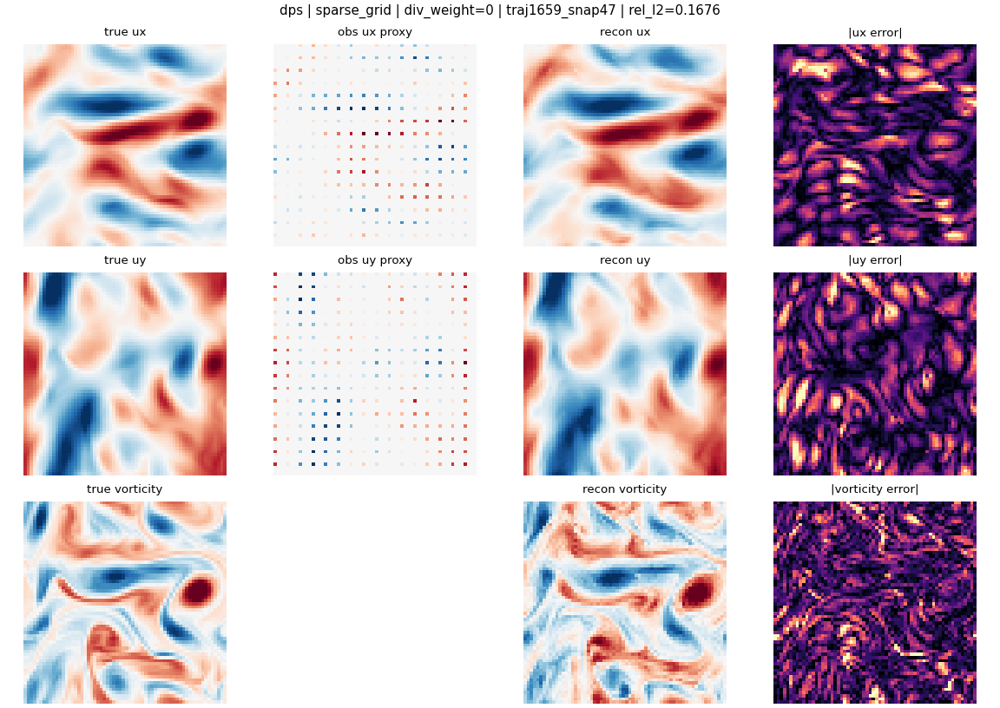

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0001_traj1717_snap6.png


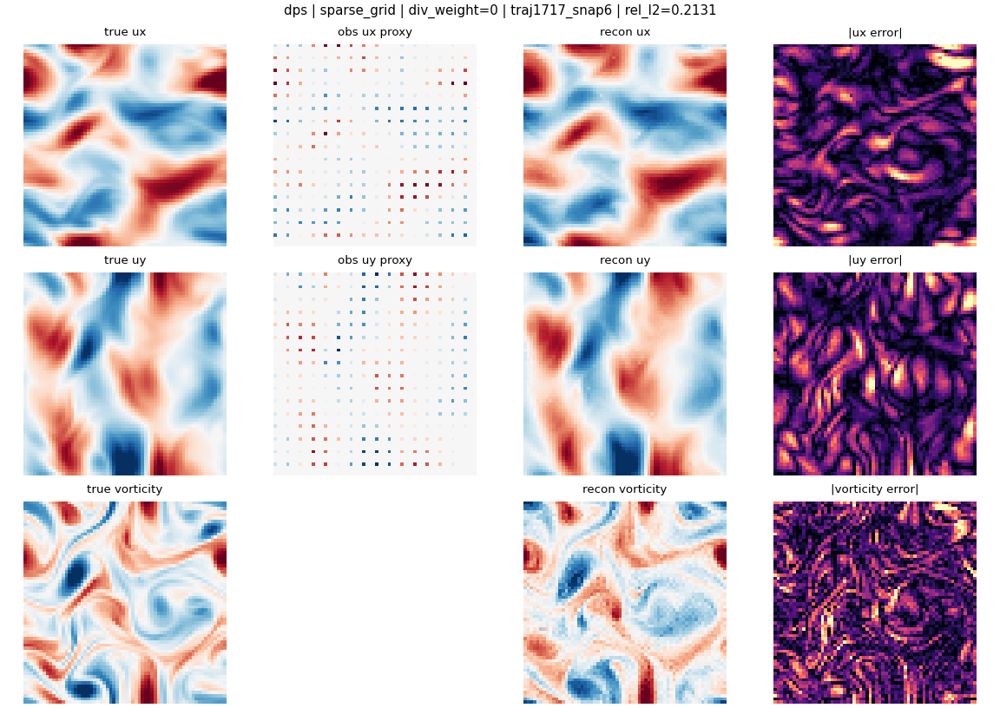

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0002_traj1691_snap5.png


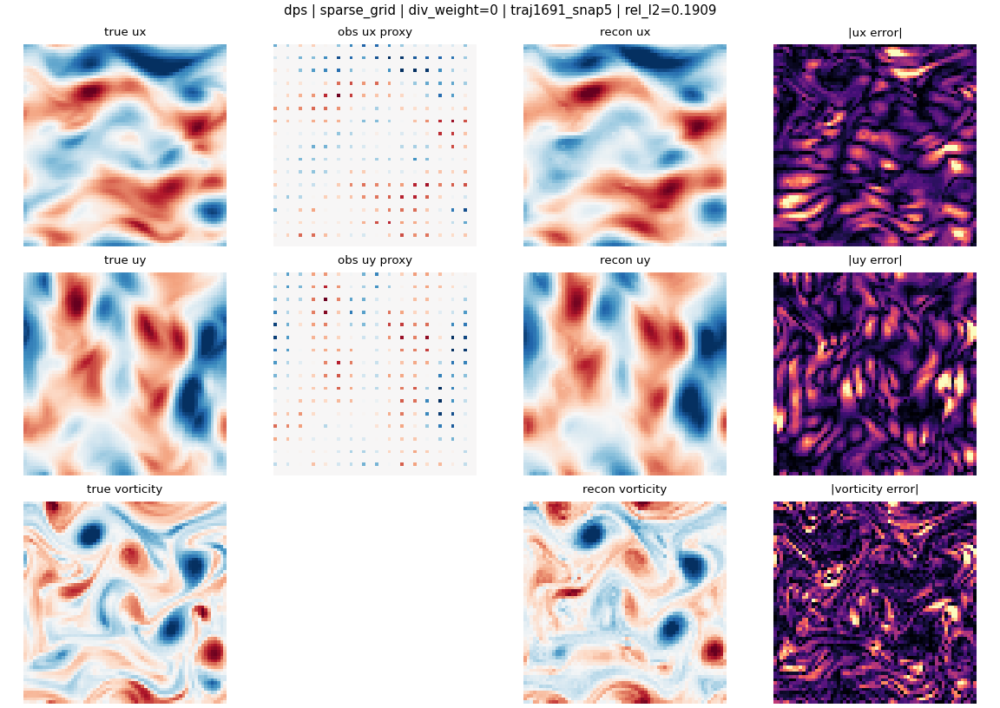

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0003_traj1672_snap19.png


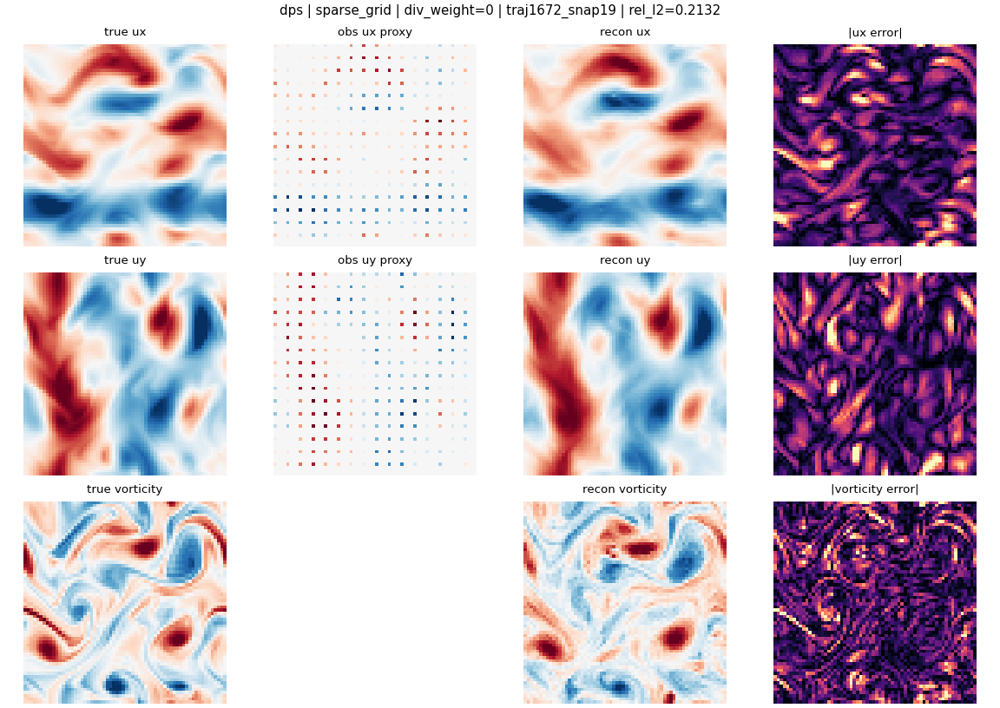

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0004_traj1672_snap22.png


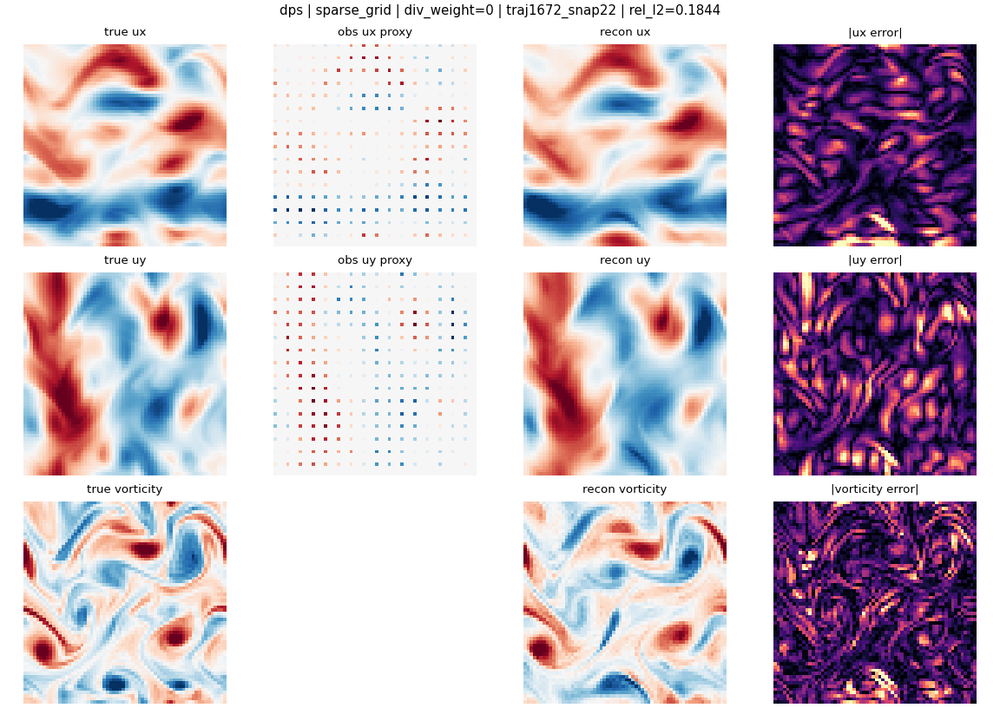

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0005_traj1650_snap15.png


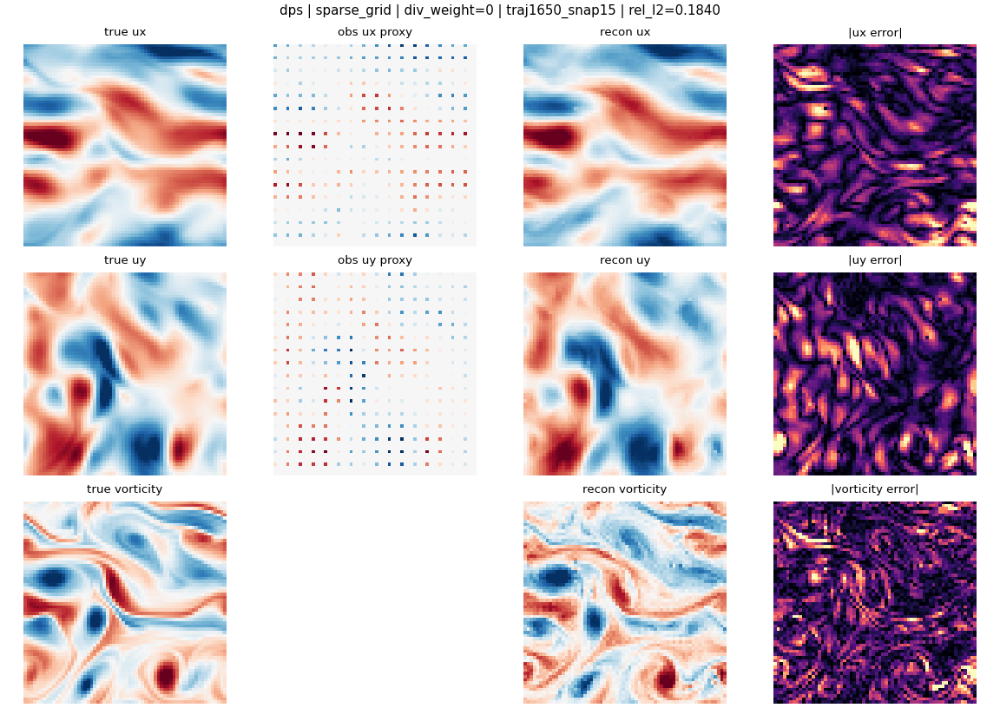

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0006_traj1713_snap12.png


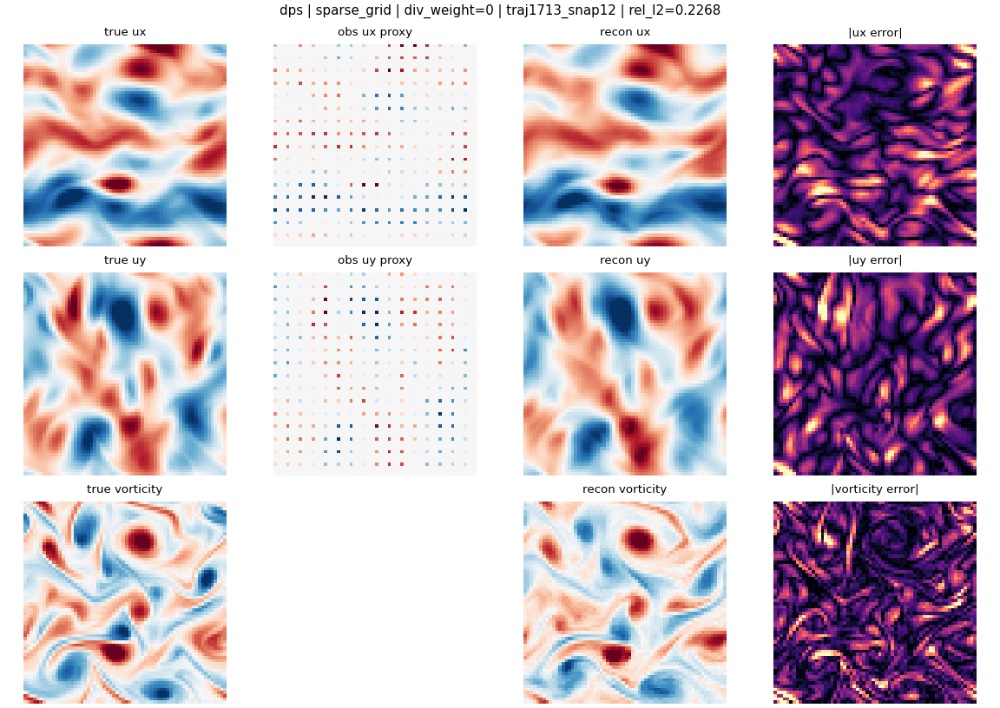

runs_inverse_colab/dps_sparse_grid_gw0p03_n16_steps128/figures/0007_traj1651_snap33.png


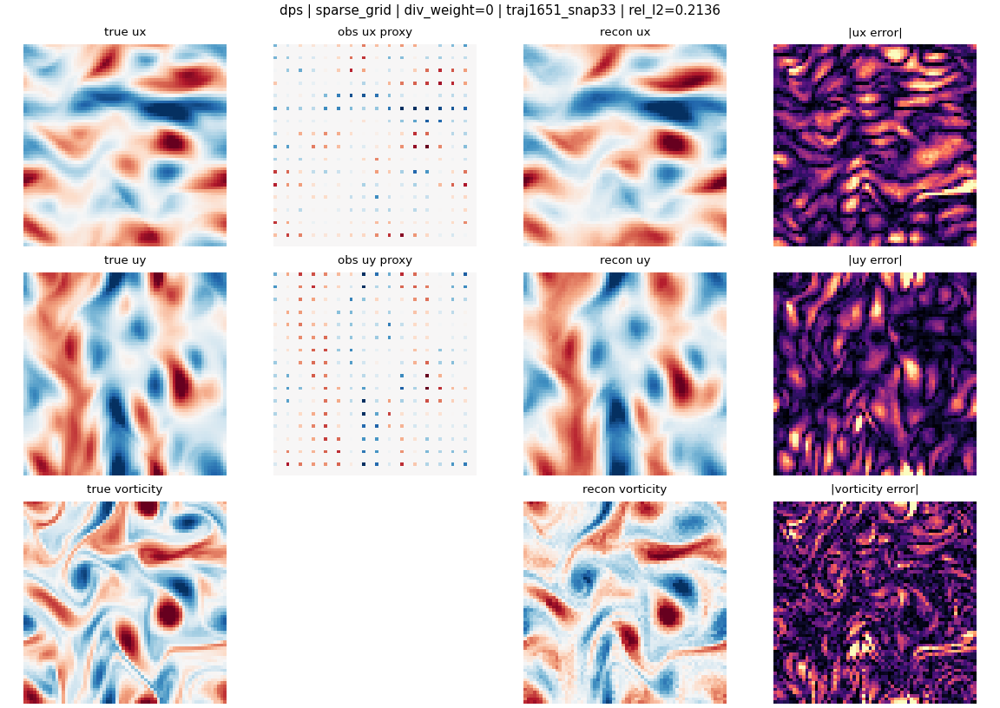

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0000_traj1659_snap47.png


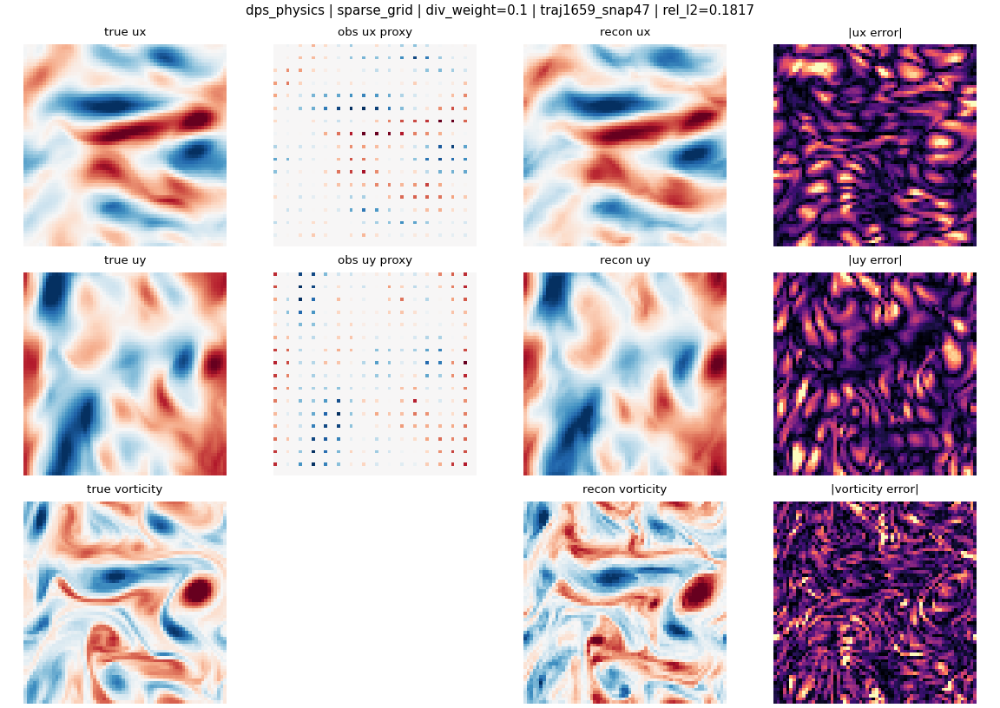

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0001_traj1717_snap6.png


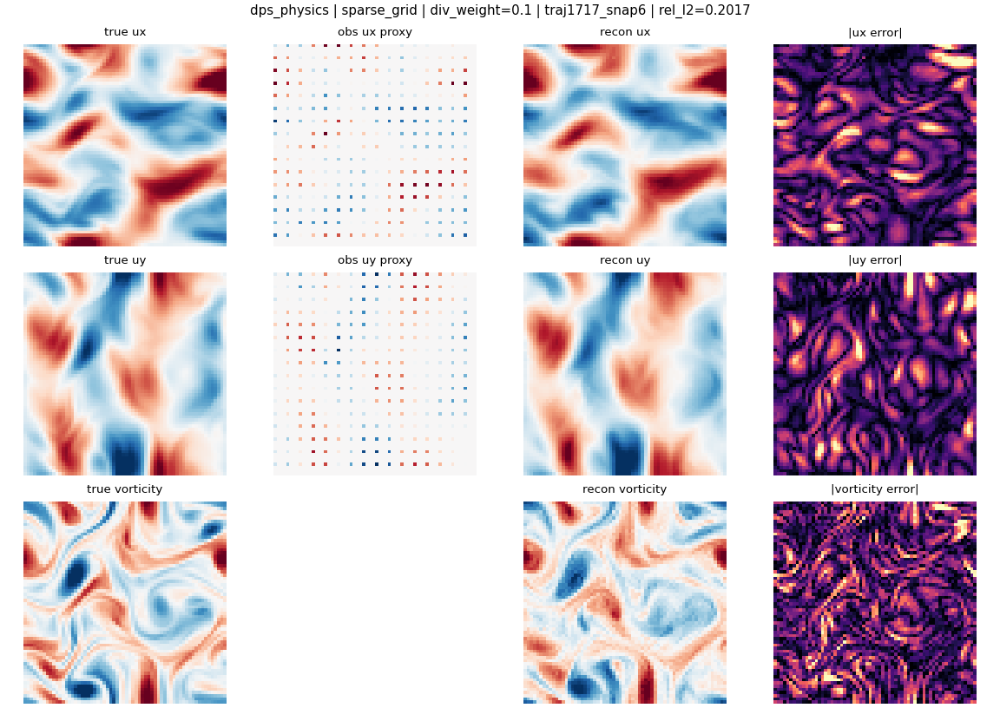

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0002_traj1691_snap5.png


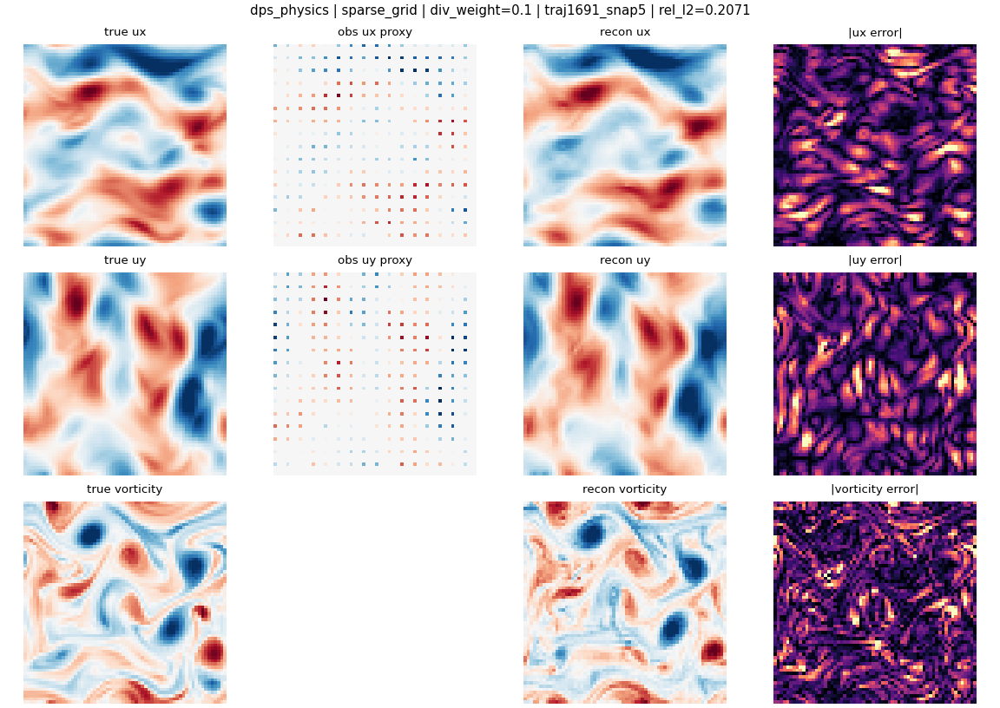

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0003_traj1672_snap19.png


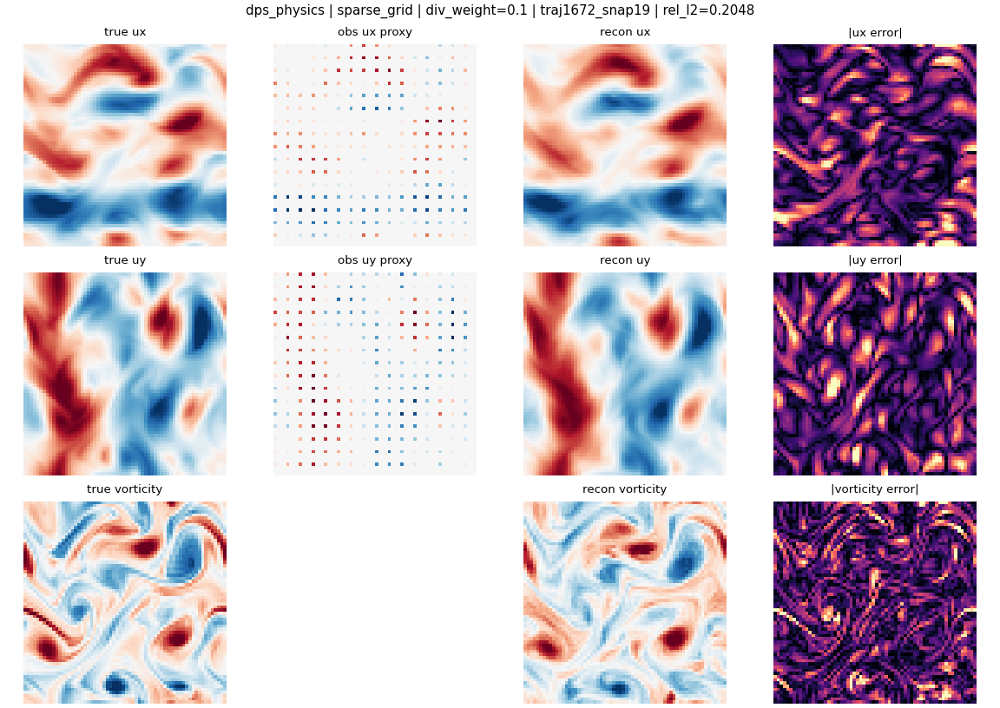

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0004_traj1672_snap22.png


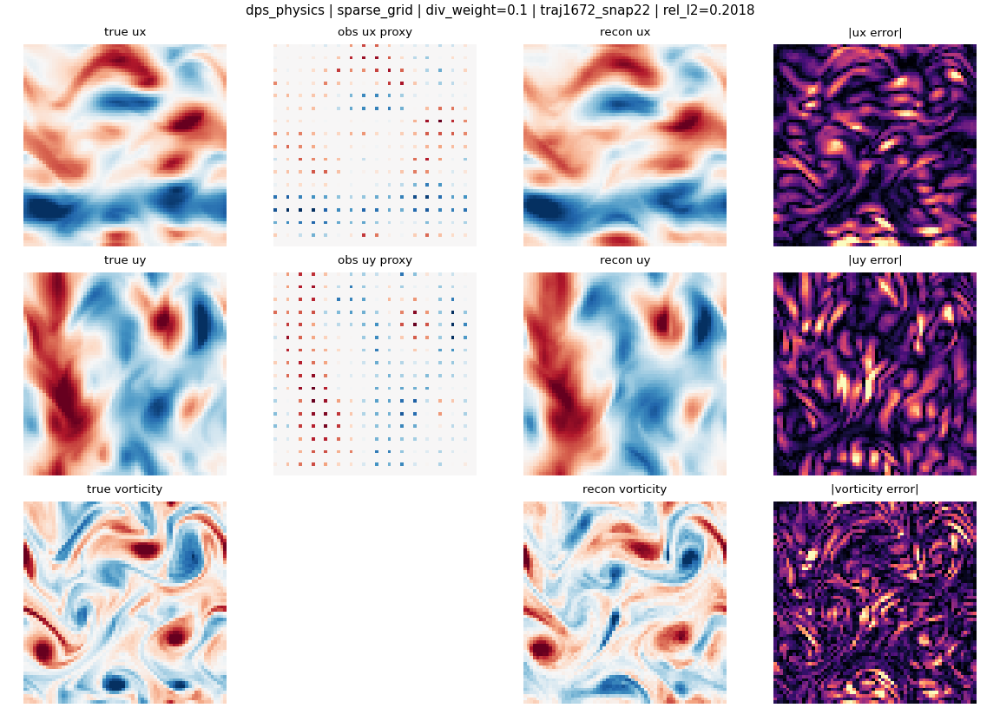

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0005_traj1650_snap15.png


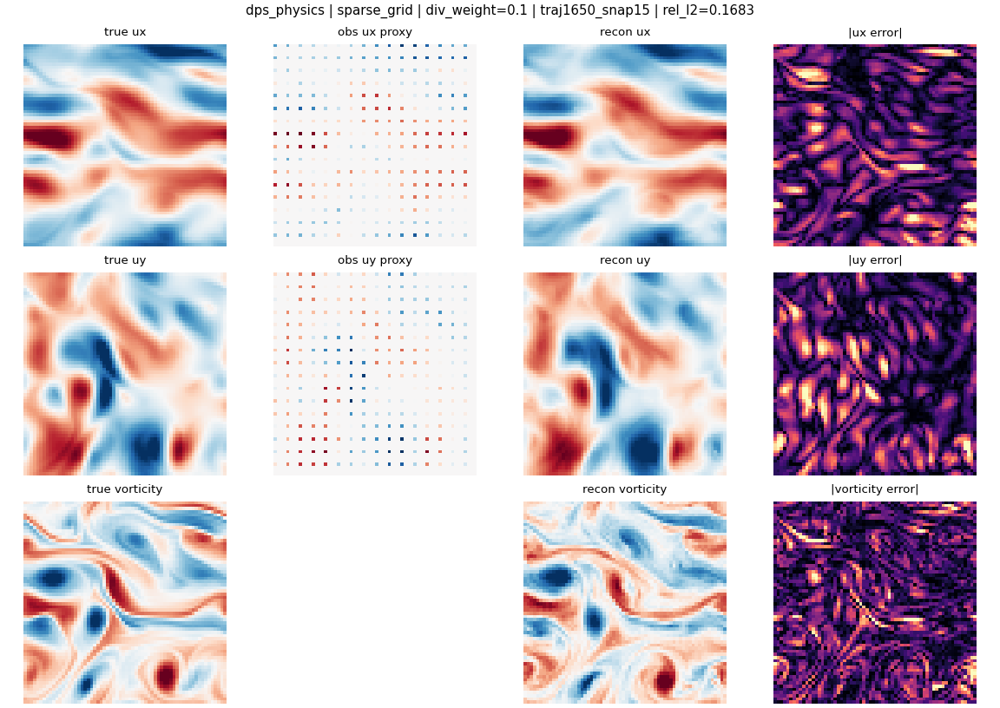

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0006_traj1713_snap12.png


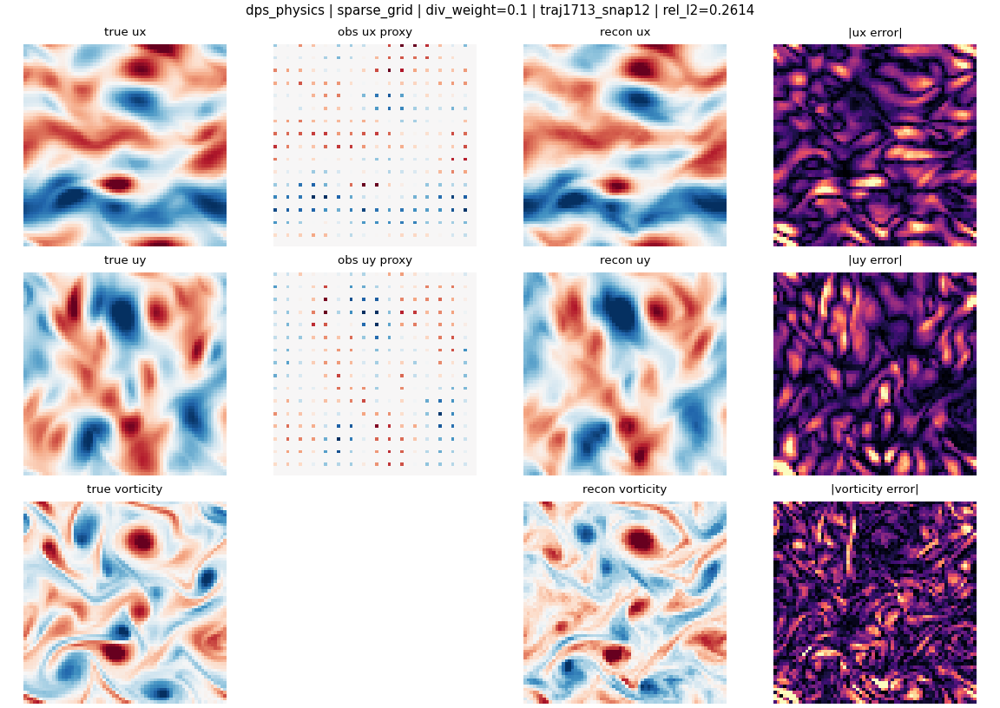

runs_inverse_colab/dps_phys_sparse_grid_gw0p03_n16_steps128/figures/0007_traj1651_snap33.png


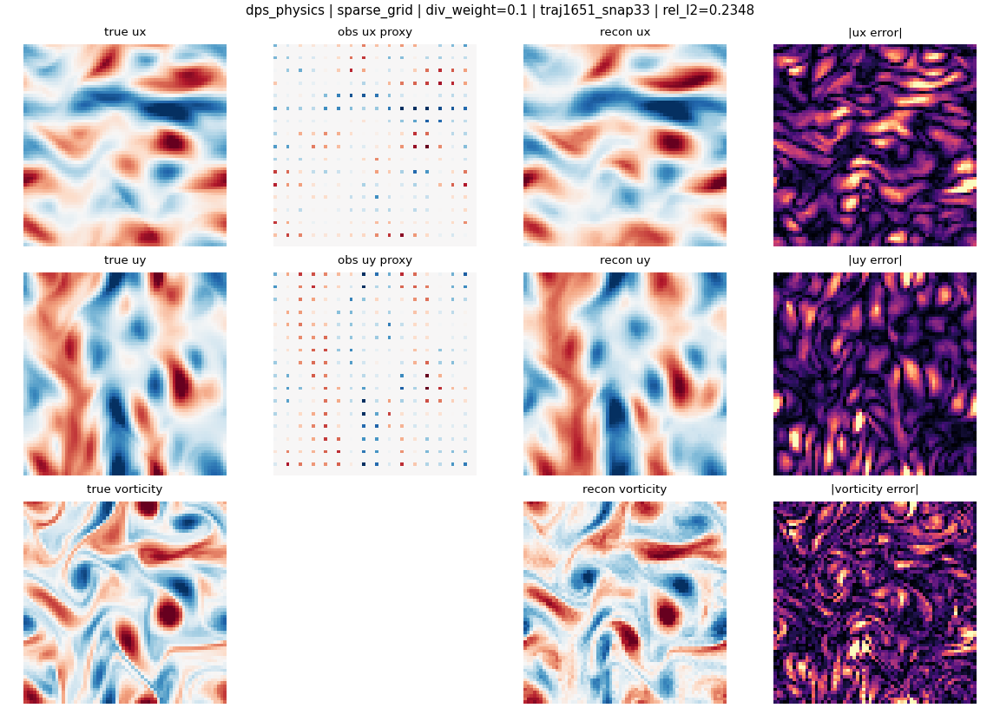

In [9]:
#@title Run sparse-grid observation
sparse_grid_metrics_paths = run_observation_experiment(
    "sparse_grid",
    SPARSE_RUNS,
    metric_sample_count=SPARSE_METRIC_SAMPLE_COUNT,
    visualization_sample_count=SPARSE_VISUALIZATION_SAMPLE_COUNT,
    max_visualizations=SPARSE_MAX_VISUALIZATIONS,
    corruption_seed=SPARSE_CORRUPTION_SEED,
    noise_sigma=SPARSE_NOISE_SIGMA,
    steps=SPARSE_DPS_STEPS,
    run_batch_size=SPARSE_RUN_BATCH_SIZE,
)


In [10]:
#@title Configure downsample run
DOWN_METRIC_SAMPLE_COUNT = METRIC_SAMPLE_COUNT  #@param {type:"integer"}
DOWN_VISUALIZATION_SAMPLE_COUNT = VISUALIZATION_SAMPLE_COUNT  #@param {type:"integer"}
DOWN_MAX_VISUALIZATIONS = min(MAX_VISUALIZATIONS, DOWN_VISUALIZATION_SAMPLE_COUNT)  #@param {type:"integer"}
DOWN_RUN_BATCH_SIZE = RUN_BATCH_SIZE  #@param {type:"integer"}
DOWN_DPS_STEPS = DPS_STEPS  #@param {type:"integer"}
DOWN_CORRUPTION_SEED = CORRUPTION_SEED  #@param {type:"integer"}
DOWN_NOISE_SIGMA = NOISE_SIGMA  #@param {type:"number"}
DOWN_DPS_GRAD_WEIGHT = 0.03  #@param {type:"number"}
DOWN_DPS_PHYS_GRAD_WEIGHT = 0.03  #@param {type:"number"}
DOWN_DPS_PHYS_DIV_WEIGHT = 0.1  #@param {type:"number"}
DOWN_GRADIENT_CLIP = 0.0  #@param {type:"number"}
DOWN_RUNS = [
    {"label": "dps", "grad_weight": DOWN_DPS_GRAD_WEIGHT, "gradient_clip": DOWN_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": 0.0},
    {"label": "dps_phys", "grad_weight": DOWN_DPS_PHYS_GRAD_WEIGHT, "gradient_clip": DOWN_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": DOWN_DPS_PHYS_DIV_WEIGHT},
]
DOWN_RUNS


[{'label': 'dps',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.0},
 {'label': 'dps_phys',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.1}]

case: inverse_cases/downsample_val16_vis8_seed0.npz
running: runs_inverse_colab/dps_downsample_gw0p03_n16_steps128


dps:downsample:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures
running: runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128


dps:downsample:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,downsample,runs_inverse_colab/dps_downsample_gw0p03_n16_s...,0.303230,0.107270,0.267289,0.004064,0.09148
1,dps_physics,dps,1,0.1,downsample,runs_inverse_colab/dps_phys_downsample_gw0p03_...,0.243767,0.088284,0.190051,0.015062,0.09408


operator csv: runs_inverse_colab/downsample_metrics.csv
displaying figures: 16 of 16
runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0000_traj1659_snap47.png


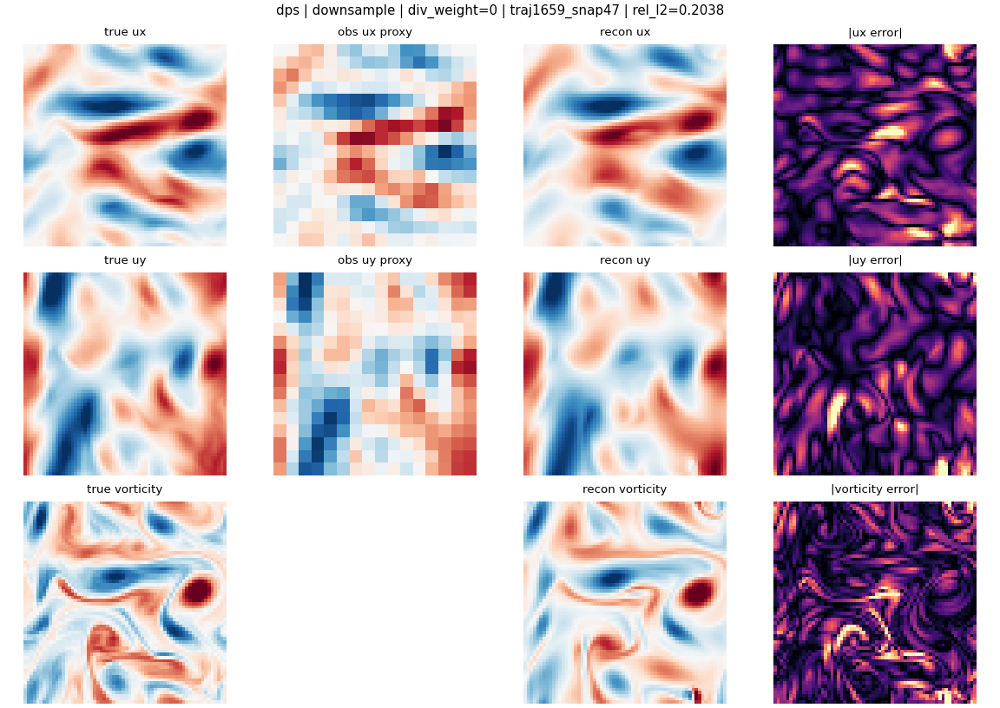

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0001_traj1717_snap6.png


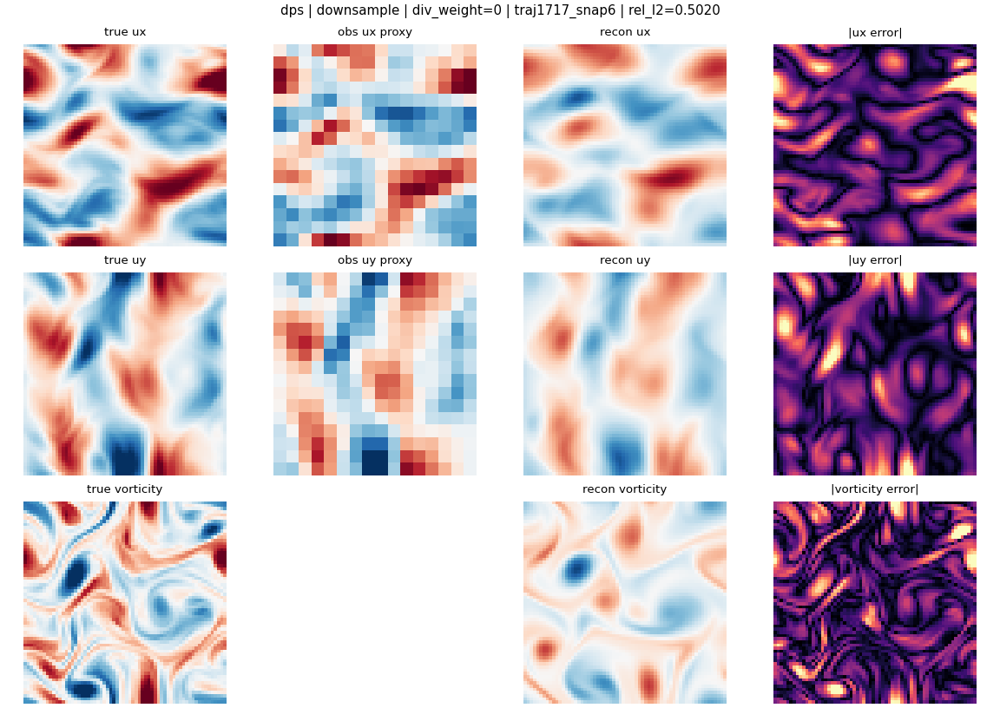

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0002_traj1691_snap5.png


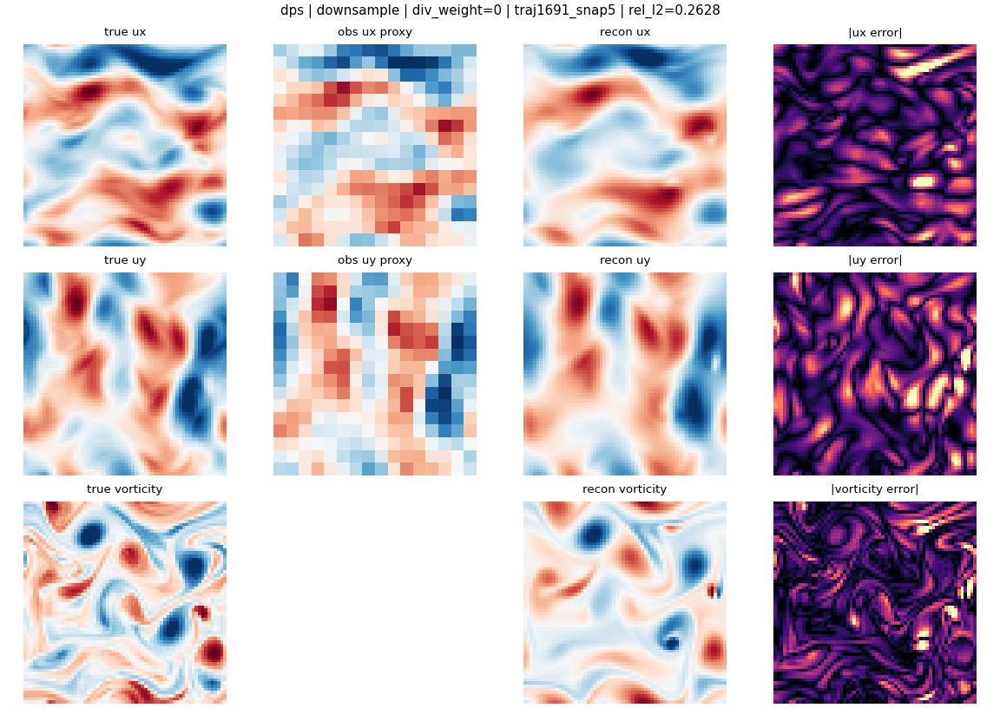

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0003_traj1672_snap19.png


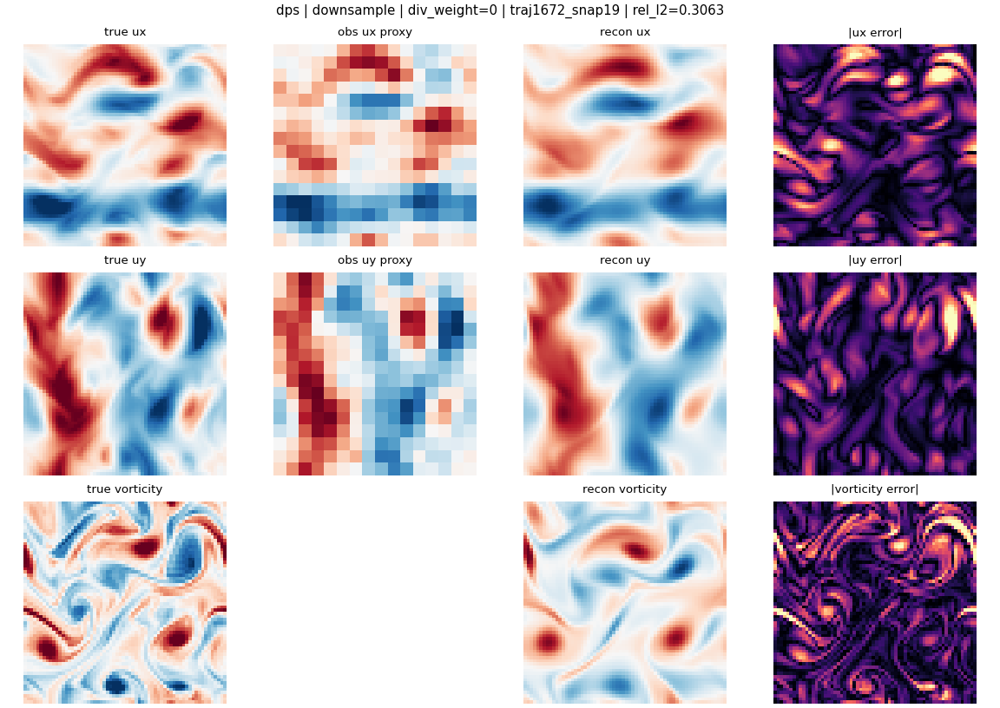

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0004_traj1672_snap22.png


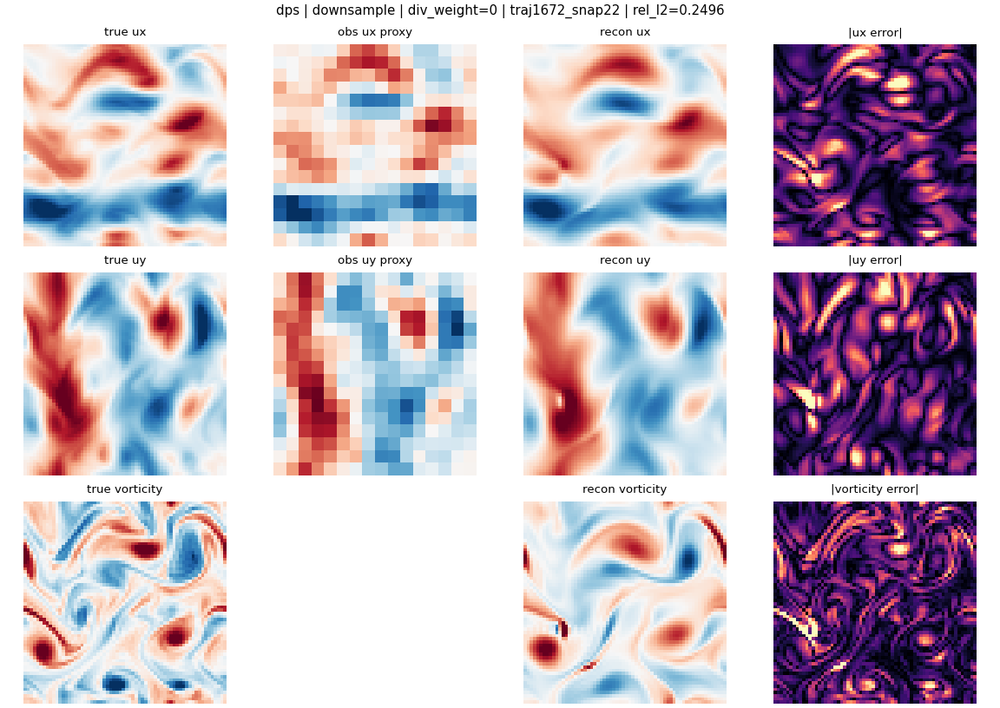

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0005_traj1650_snap15.png


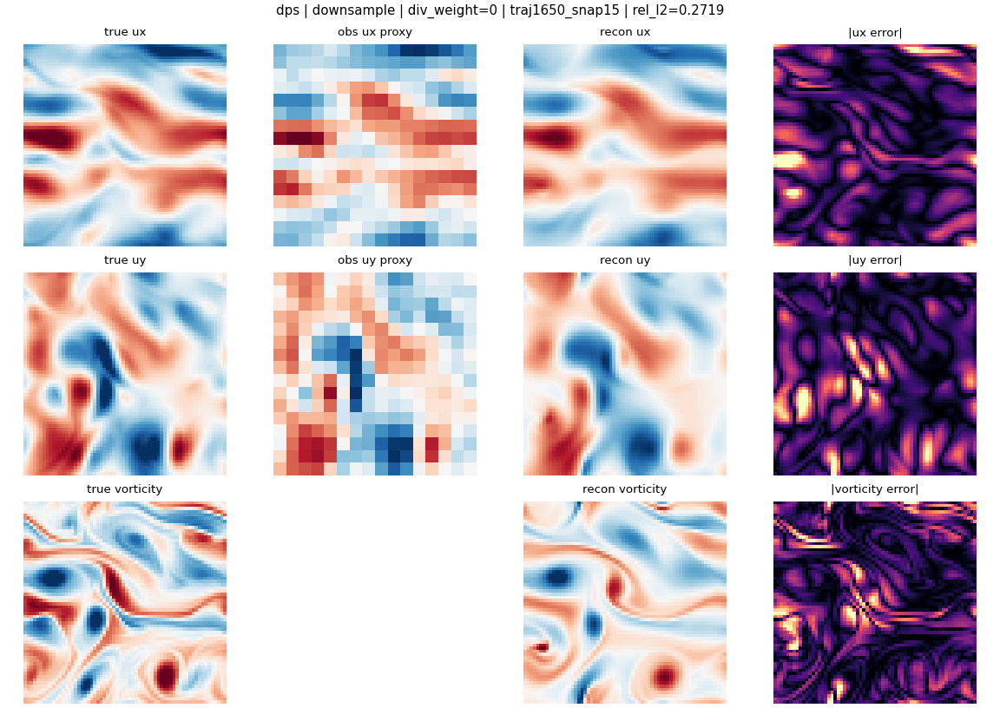

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0006_traj1713_snap12.png


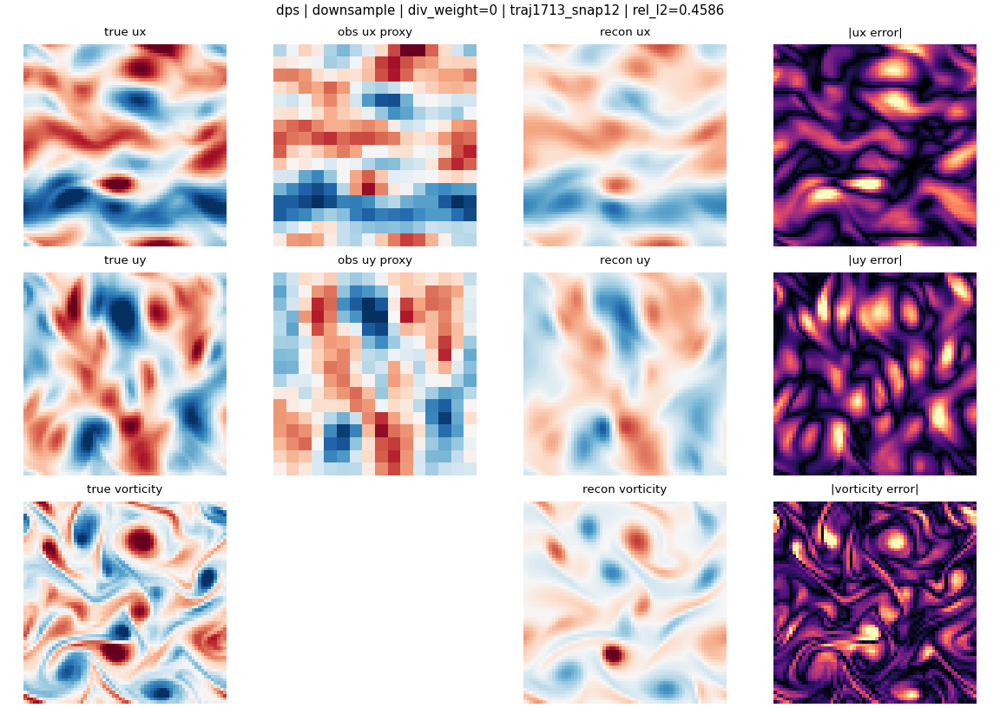

runs_inverse_colab/dps_downsample_gw0p03_n16_steps128/figures/0007_traj1651_snap33.png


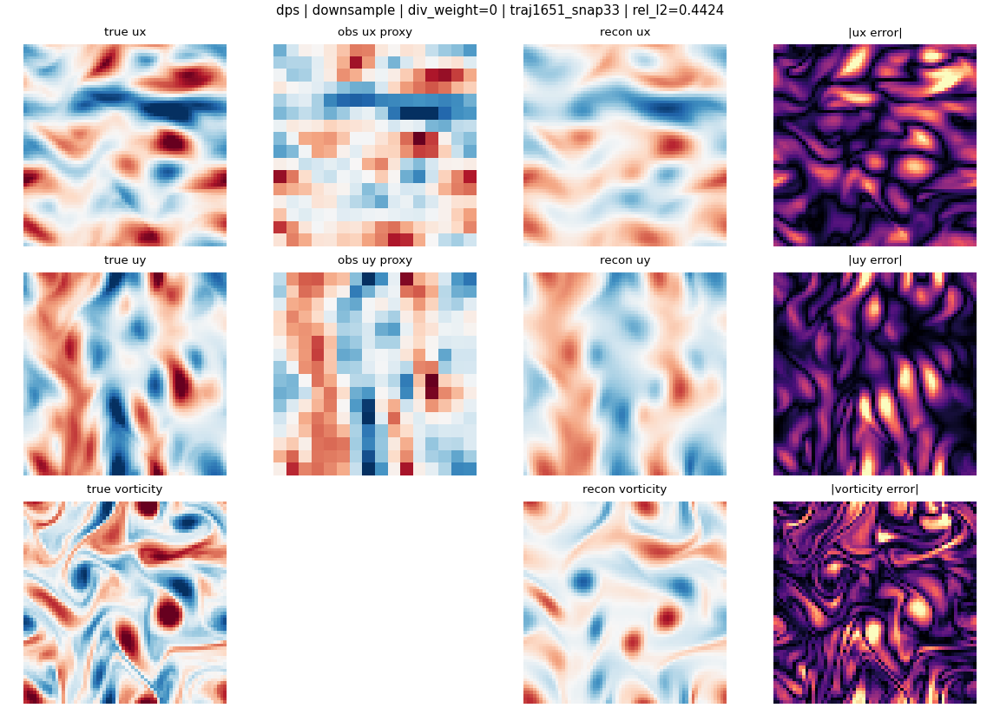

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0000_traj1659_snap47.png


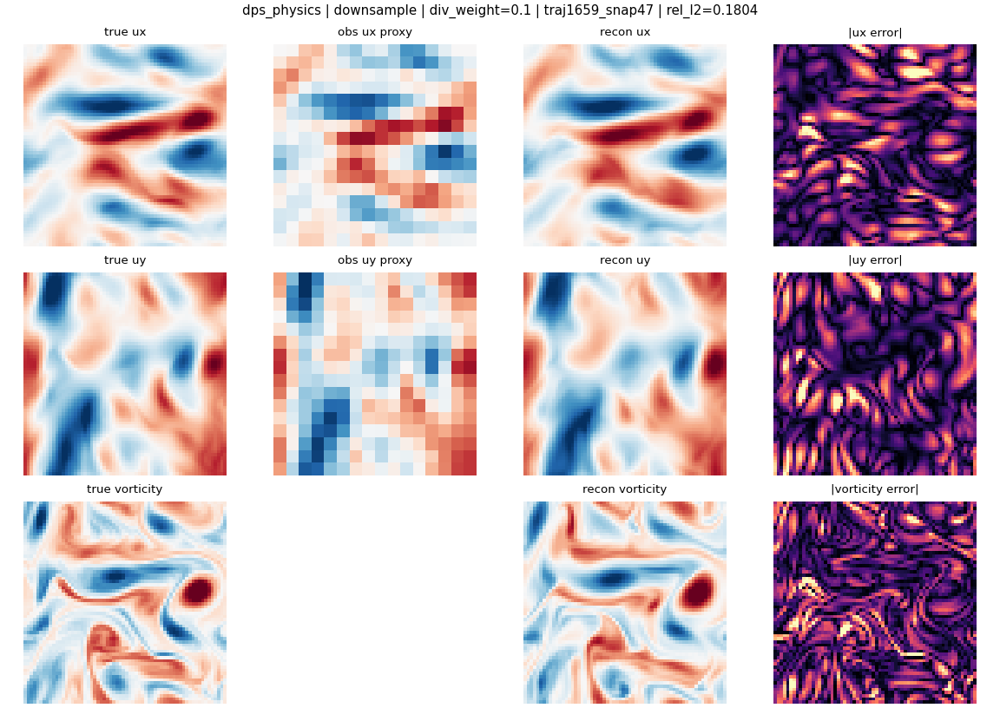

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0001_traj1717_snap6.png


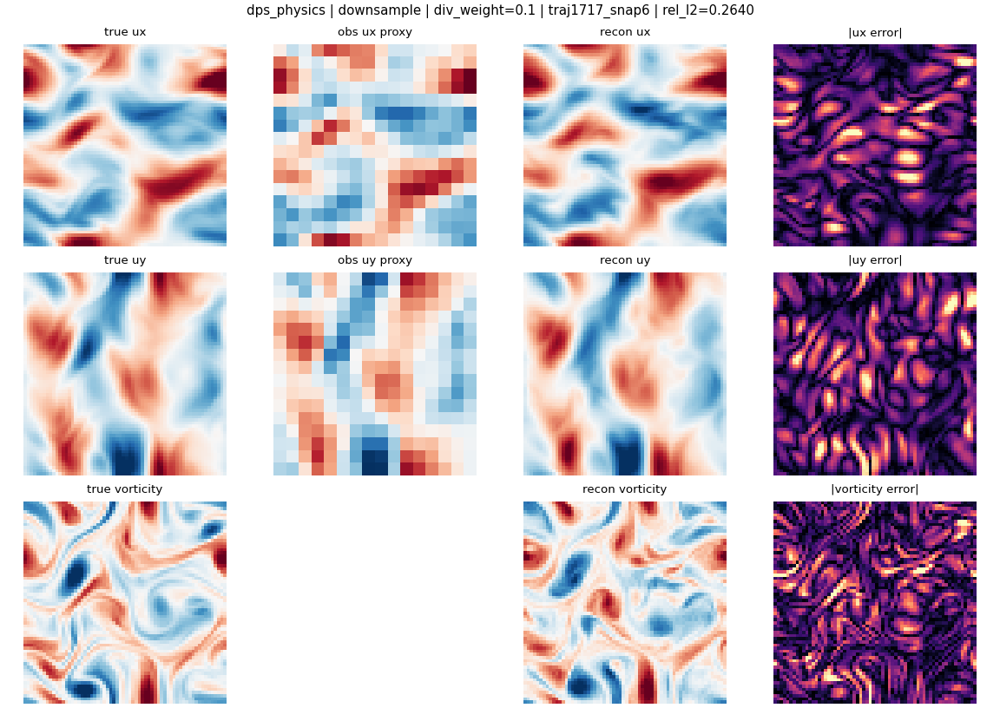

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0002_traj1691_snap5.png


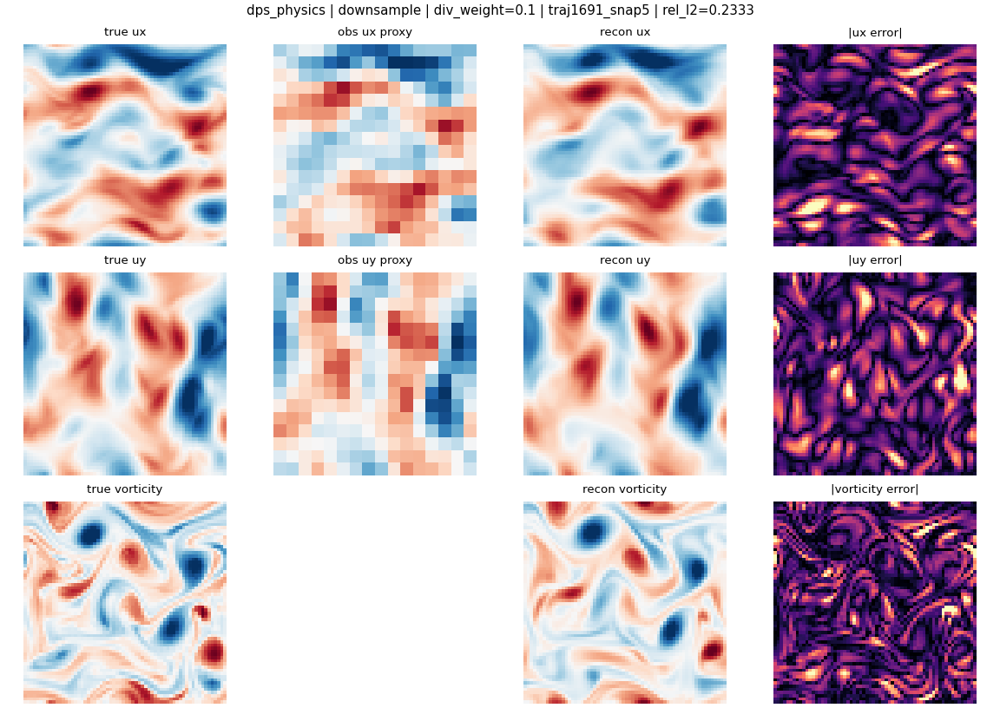

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0003_traj1672_snap19.png


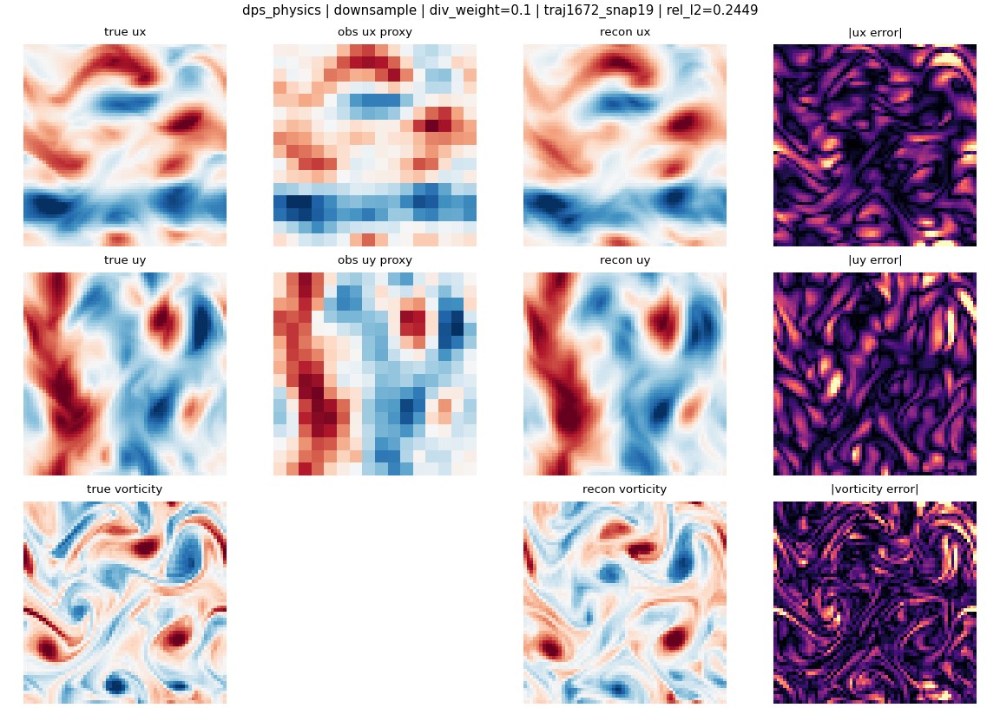

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0004_traj1672_snap22.png


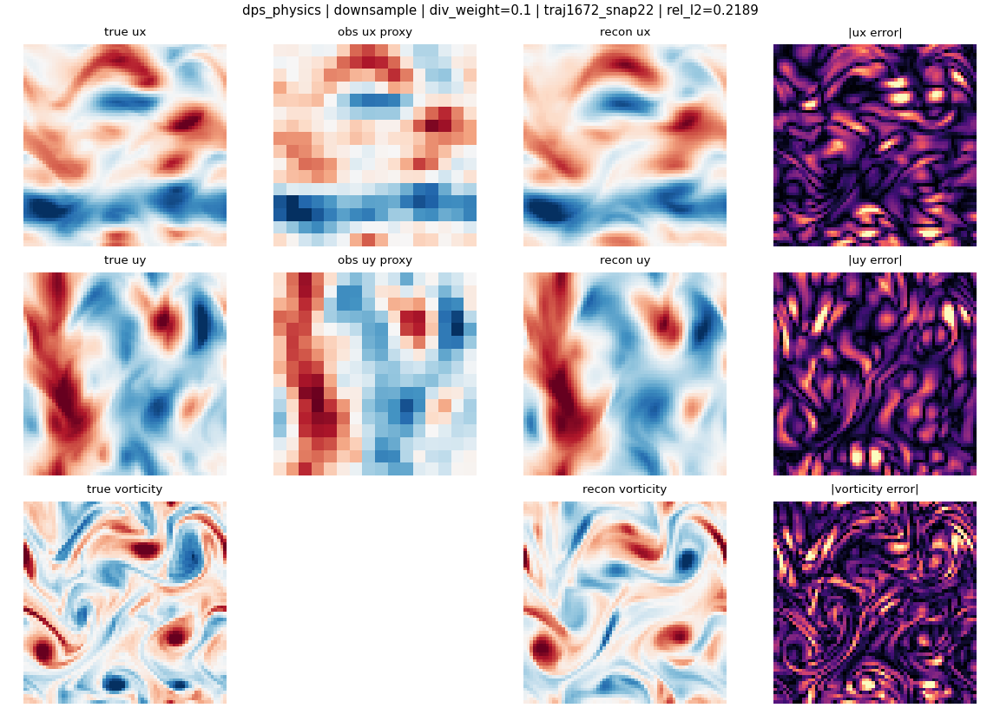

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0005_traj1650_snap15.png


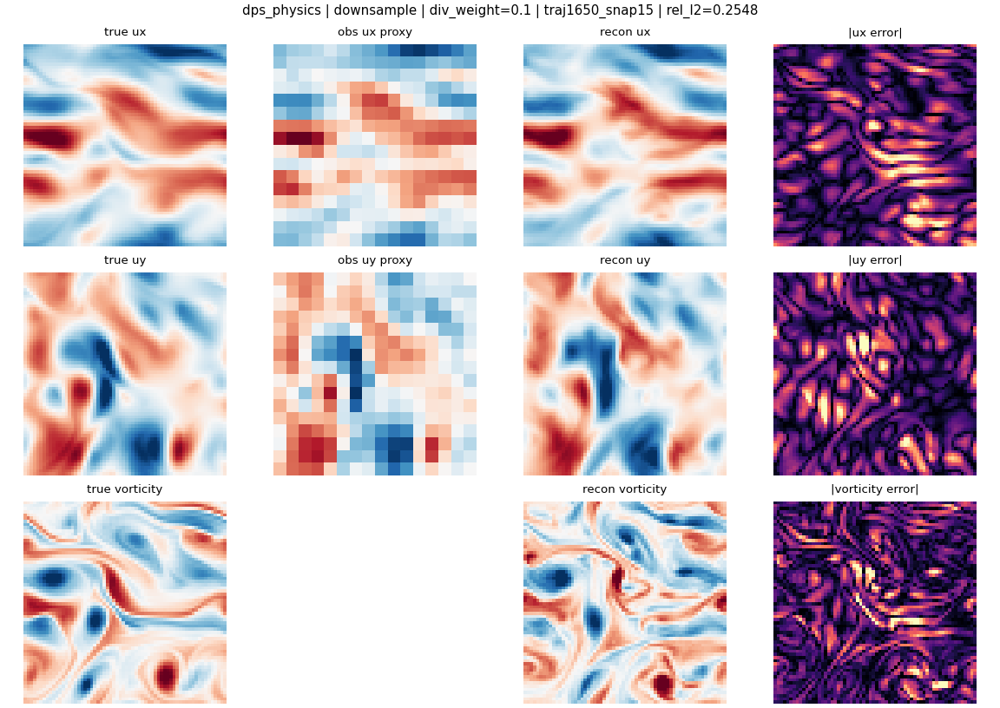

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0006_traj1713_snap12.png


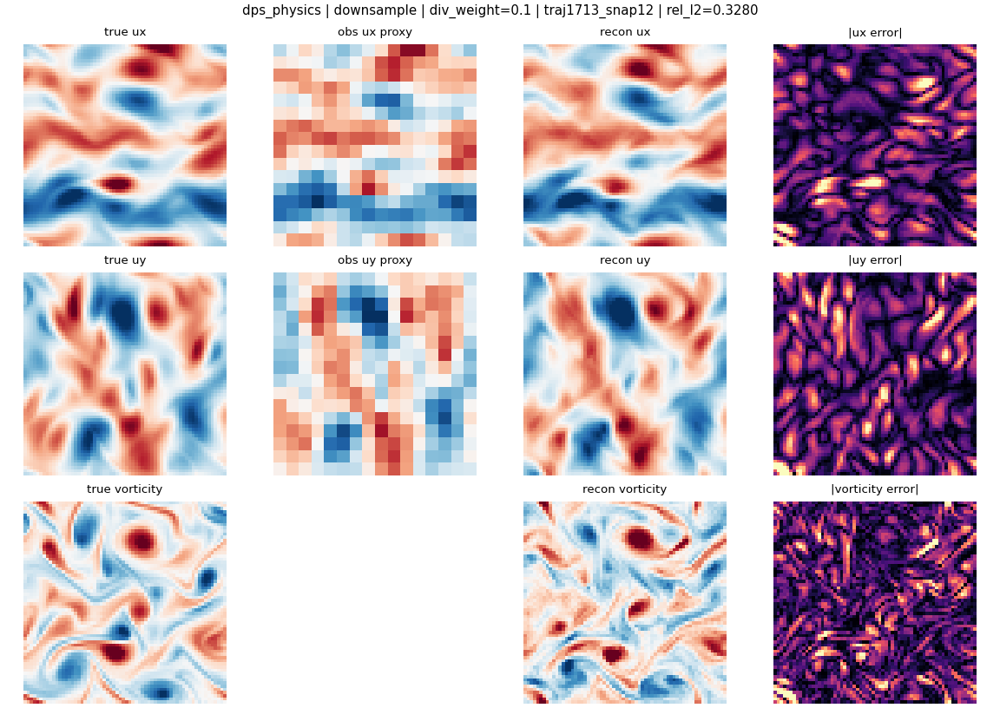

runs_inverse_colab/dps_phys_downsample_gw0p03_n16_steps128/figures/0007_traj1651_snap33.png


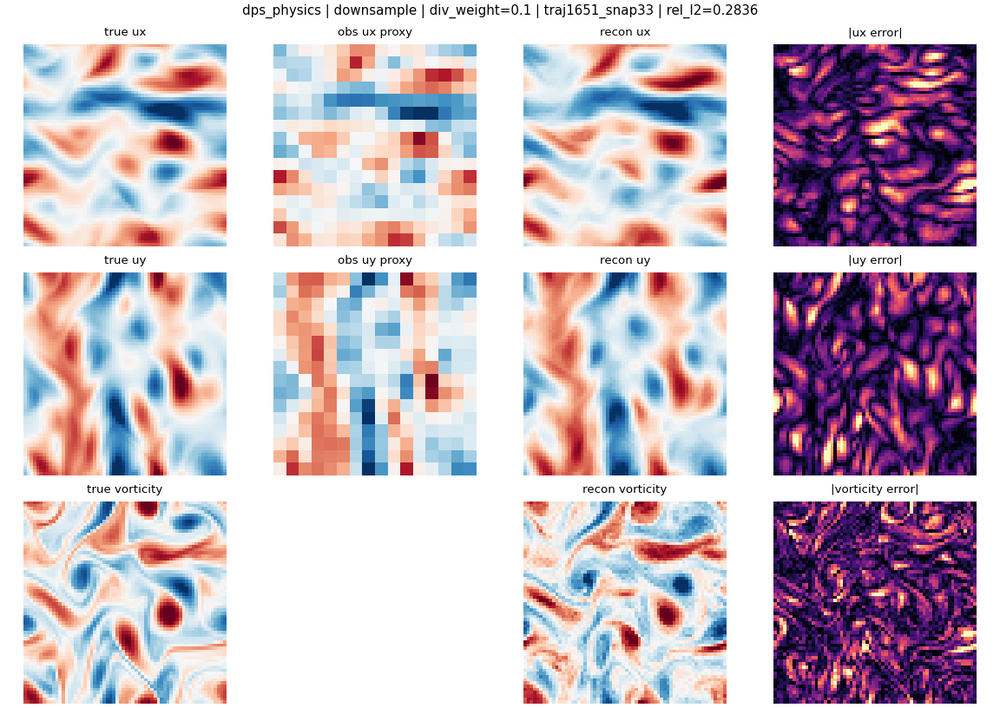

In [11]:
#@title Run downsample observation
downsample_metrics_paths = run_observation_experiment(
    "downsample",
    DOWN_RUNS,
    metric_sample_count=DOWN_METRIC_SAMPLE_COUNT,
    visualization_sample_count=DOWN_VISUALIZATION_SAMPLE_COUNT,
    max_visualizations=DOWN_MAX_VISUALIZATIONS,
    corruption_seed=DOWN_CORRUPTION_SEED,
    noise_sigma=DOWN_NOISE_SIGMA,
    steps=DOWN_DPS_STEPS,
    run_batch_size=DOWN_RUN_BATCH_SIZE,
)


In [12]:
#@title Configure strong-blur run
BLUR_METRIC_SAMPLE_COUNT = METRIC_SAMPLE_COUNT  #@param {type:"integer"}
BLUR_VISUALIZATION_SAMPLE_COUNT = VISUALIZATION_SAMPLE_COUNT  #@param {type:"integer"}
BLUR_MAX_VISUALIZATIONS = min(MAX_VISUALIZATIONS, BLUR_VISUALIZATION_SAMPLE_COUNT)  #@param {type:"integer"}
BLUR_RUN_BATCH_SIZE = RUN_BATCH_SIZE  #@param {type:"integer"}
BLUR_DPS_STEPS = DPS_STEPS  #@param {type:"integer"}
BLUR_CORRUPTION_SEED = CORRUPTION_SEED  #@param {type:"integer"}
BLUR_NOISE_SIGMA = NOISE_SIGMA  #@param {type:"number"}
BLUR_OBS_SIGMA = BLUR_SIGMA  #@param {type:"number"}
BLUR_DPS_GRAD_WEIGHT = 0.05  #@param {type:"number"}
BLUR_DPS_PHYS_GRAD_WEIGHT = 0.05  #@param {type:"number"}
BLUR_DPS_PHYS_DIV_WEIGHT = 0.1  #@param {type:"number"}
BLUR_GRADIENT_CLIP = 0.0  #@param {type:"number"}
BLUR_RUNS = [
    {"label": "dps", "grad_weight": BLUR_DPS_GRAD_WEIGHT, "gradient_clip": BLUR_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": 0.0},
    {"label": "dps_phys", "grad_weight": BLUR_DPS_PHYS_GRAD_WEIGHT, "gradient_clip": BLUR_GRADIENT_CLIP, "measurement_sigma": 0.0, "div_weight": BLUR_DPS_PHYS_DIV_WEIGHT},
]
BLUR_RUNS


[{'label': 'dps',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.0},
 {'label': 'dps_phys',
  'grad_weight': 0.03,
  'gradient_clip': 0.0,
  'measurement_sigma': 0.0,
  'div_weight': 0.1}]

case: inverse_cases/blur_blur4p0_val16_vis8_seed0.npz
running: runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0


dps:blur:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures
running: runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0


dps:blur:   0%|          | 0/1 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/metrics.csv
saved figures: 8 in runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,blur,runs_inverse_colab/dps_blur_gw0p03_n16_steps12...,0.430290,0.155020,0.106094,0.009766,0.144767
1,dps_physics,dps,1,0.1,blur,runs_inverse_colab/dps_phys_blur_gw0p03_n16_st...,0.455401,0.166104,0.114217,0.007488,0.147552


operator csv: runs_inverse_colab/blur_blur4p0_metrics.csv
displaying figures: 16 of 16
runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0000_traj1659_snap47.png


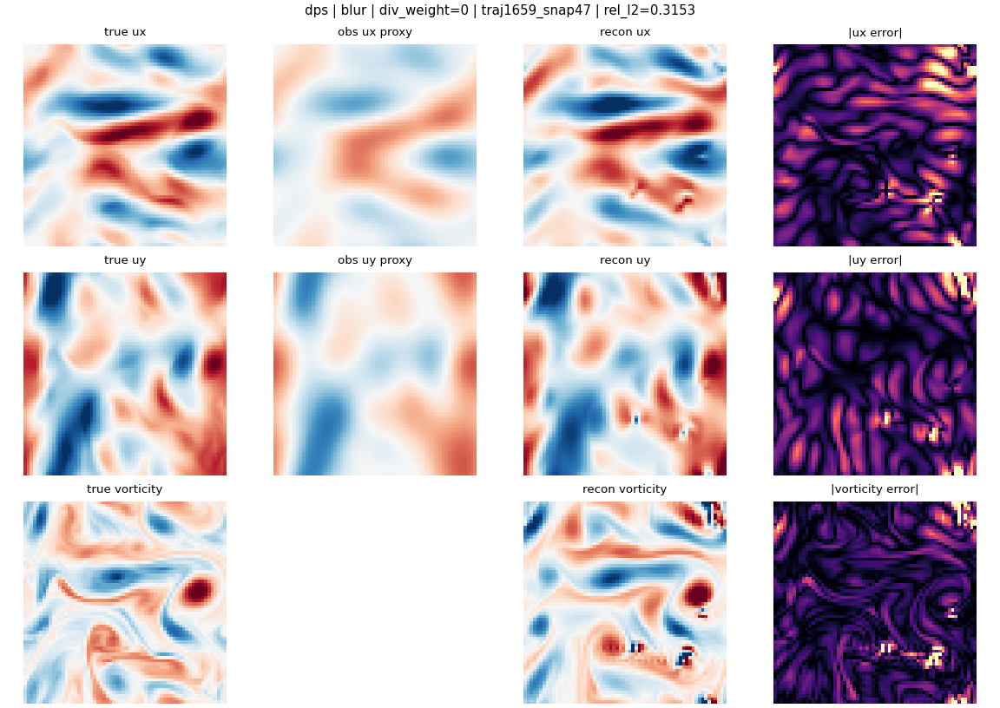

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0001_traj1717_snap6.png


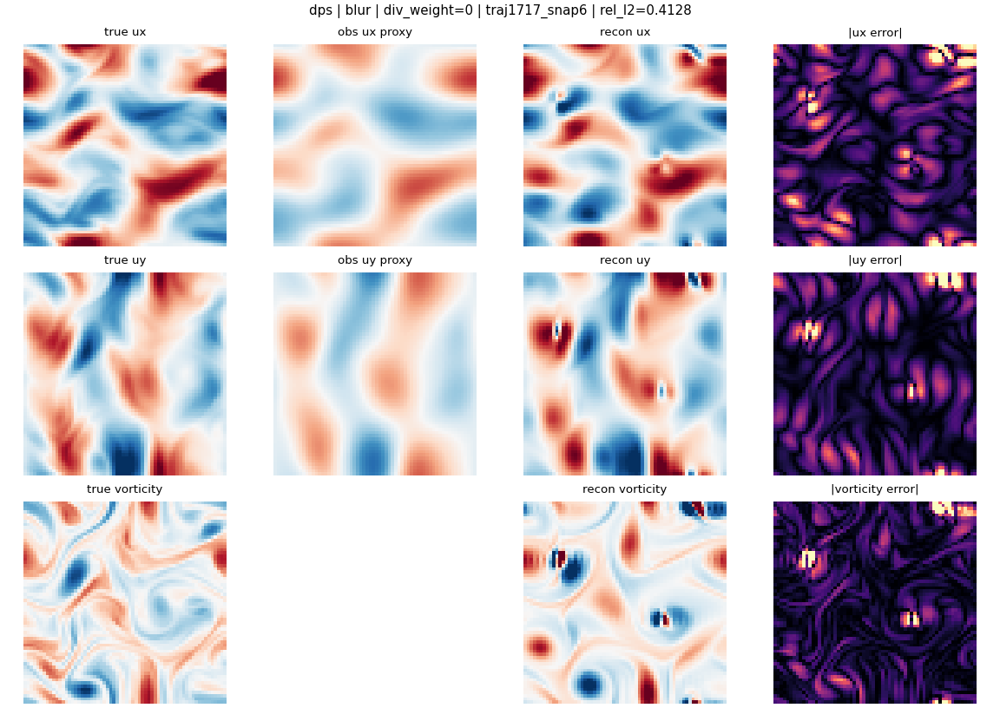

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0002_traj1691_snap5.png


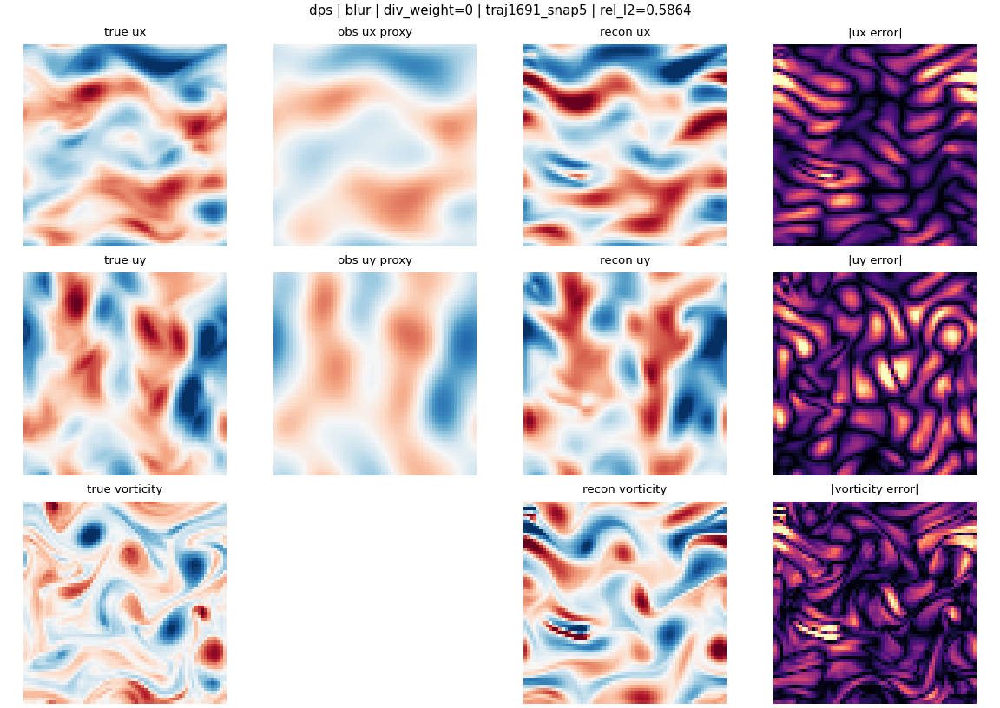

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0003_traj1672_snap19.png


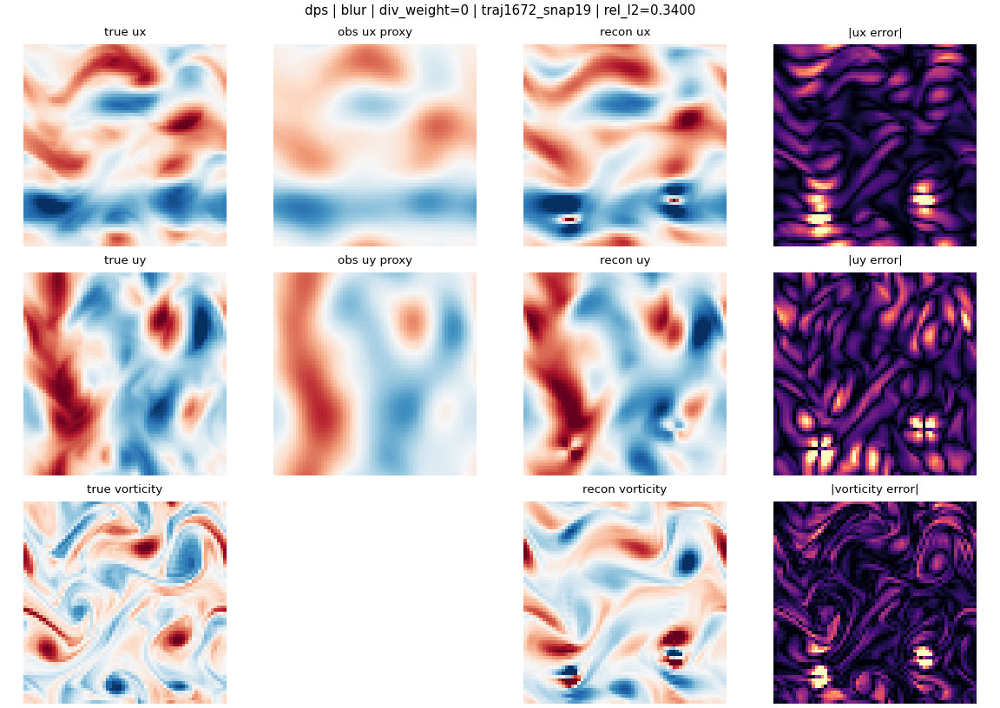

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0004_traj1672_snap22.png


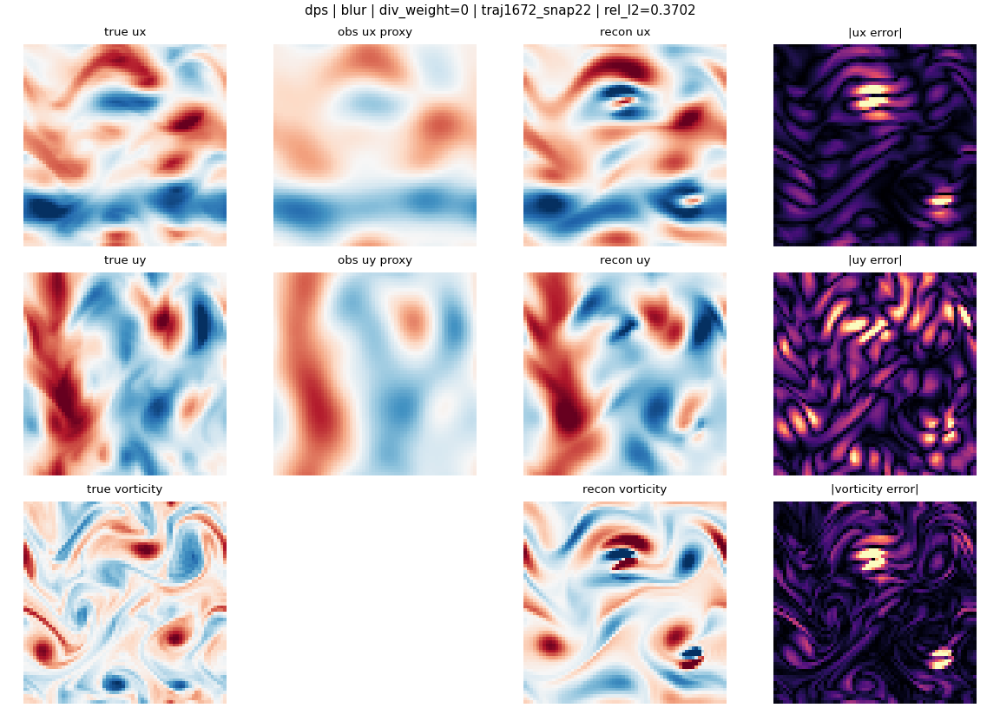

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0005_traj1650_snap15.png


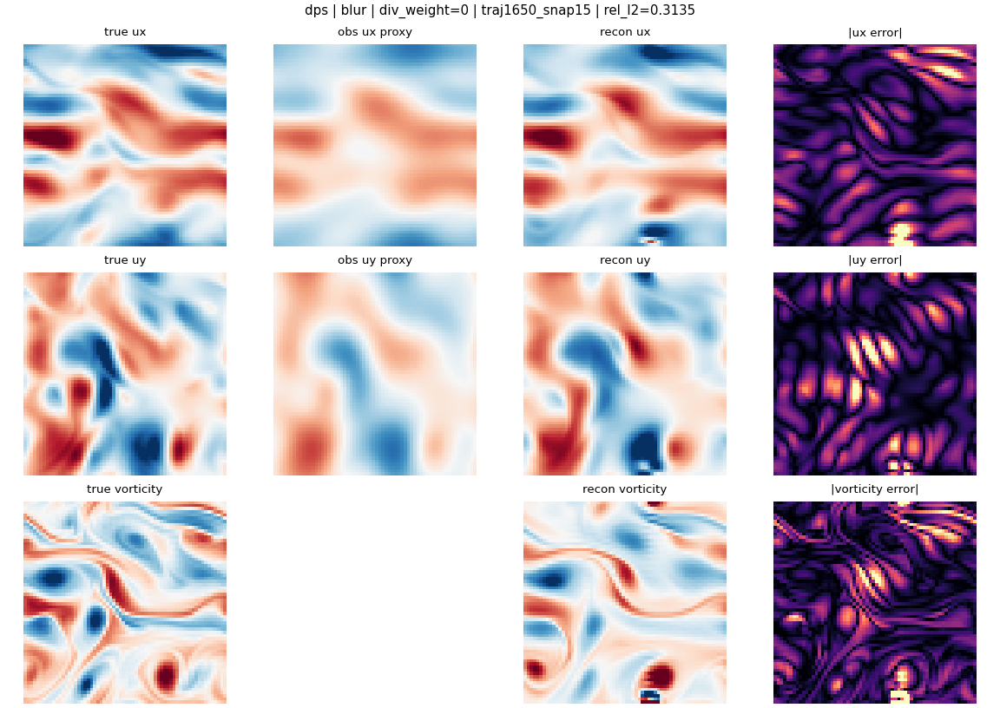

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0006_traj1713_snap12.png


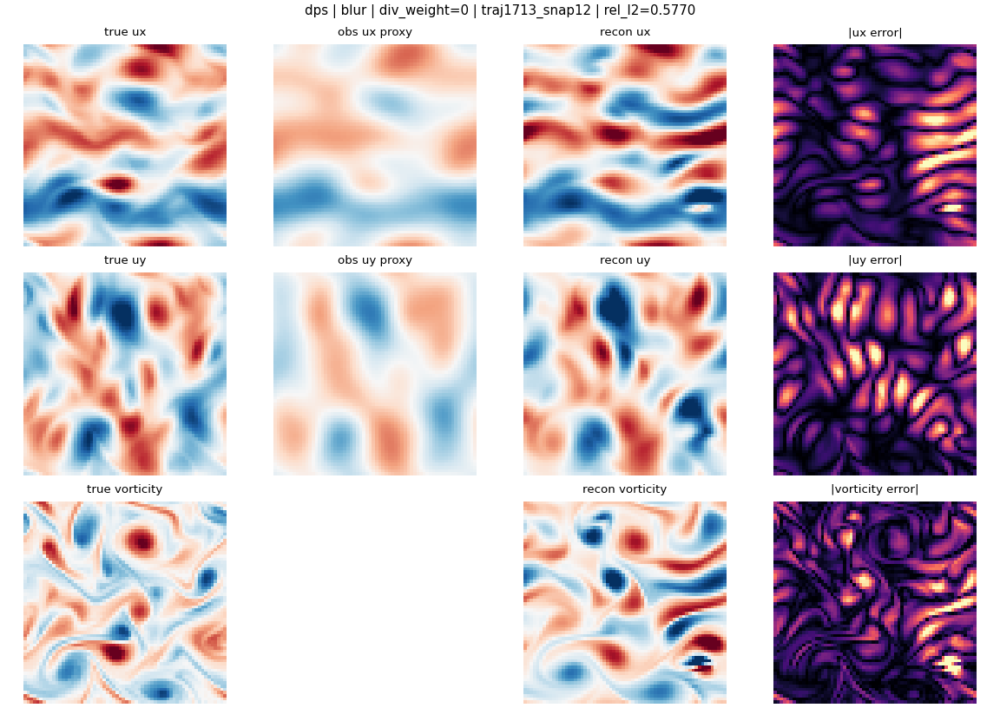

runs_inverse_colab/dps_blur_gw0p03_n16_steps128_sigma4p0/figures/0007_traj1651_snap33.png


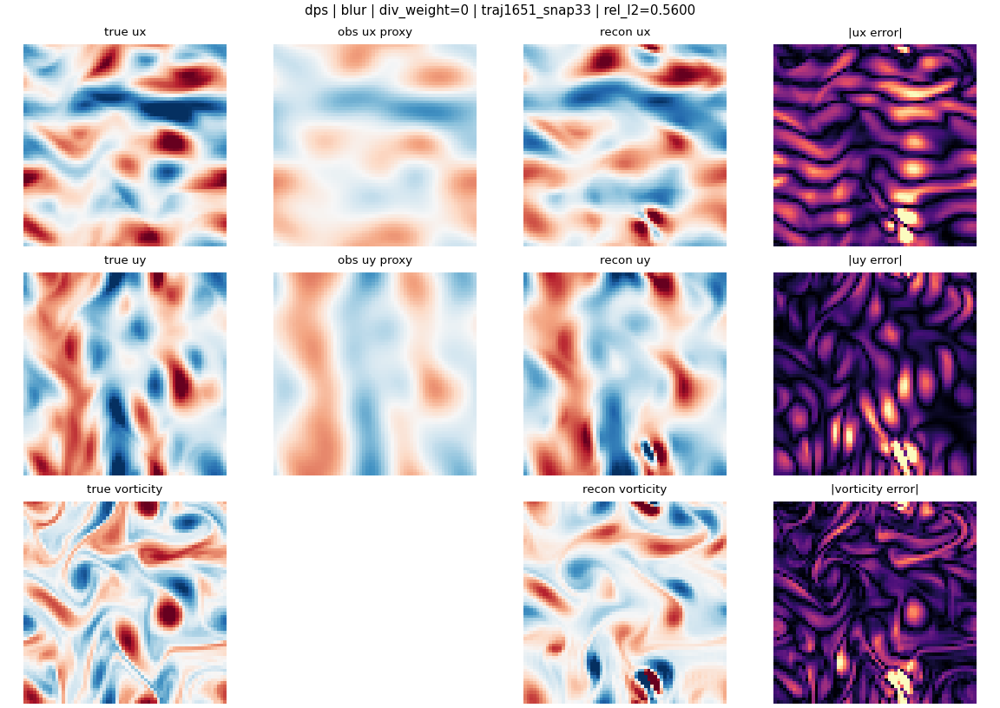

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0000_traj1659_snap47.png


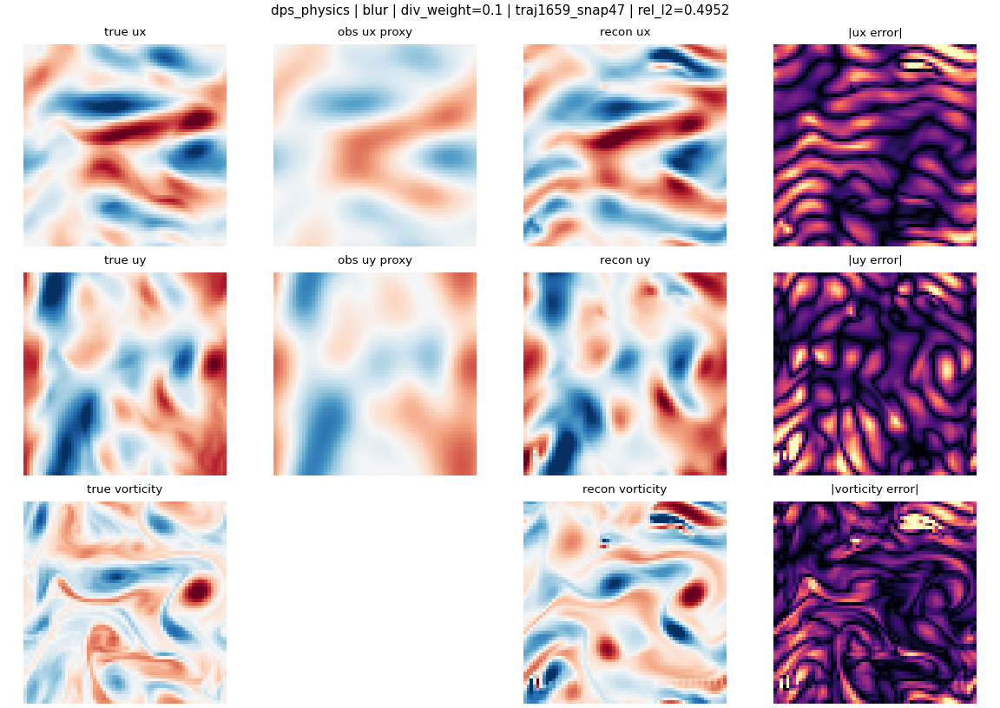

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0001_traj1717_snap6.png


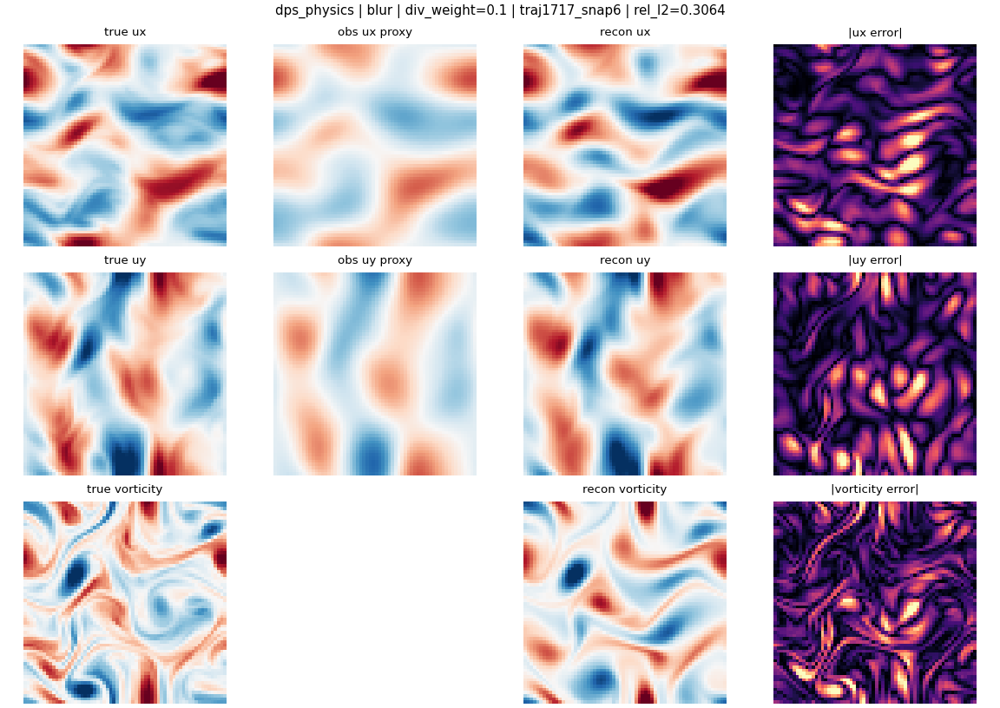

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0002_traj1691_snap5.png


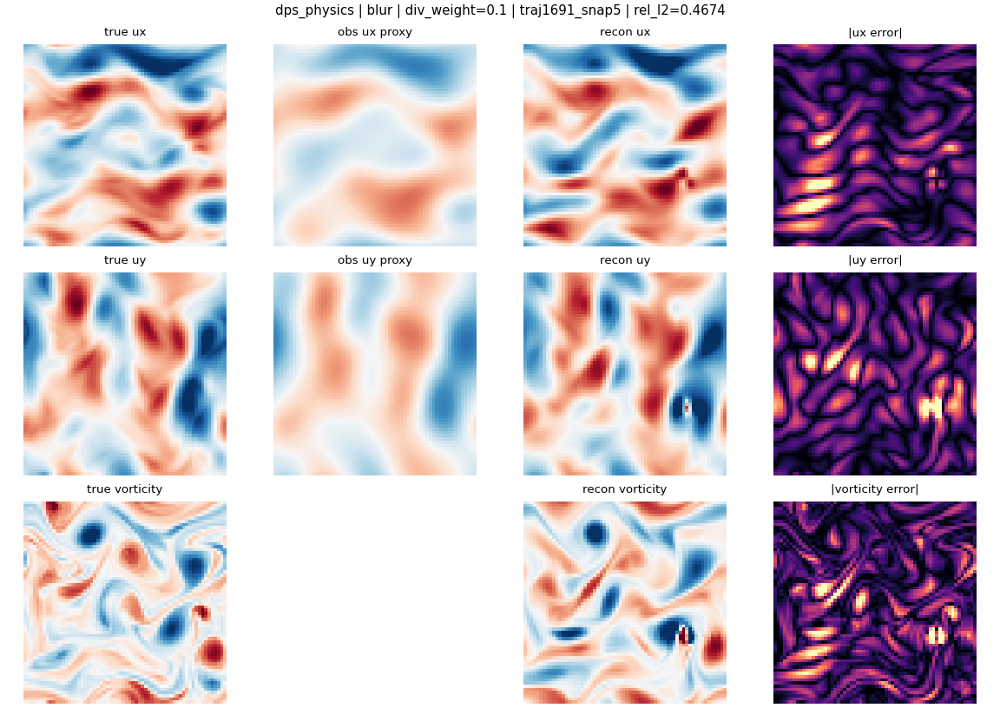

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0003_traj1672_snap19.png


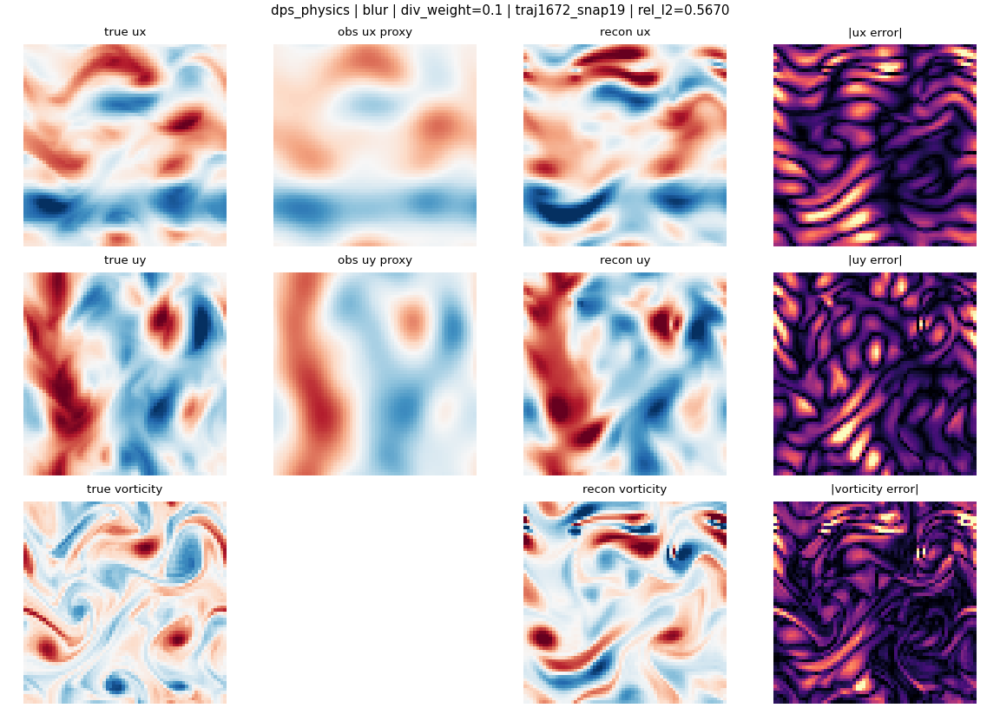

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0004_traj1672_snap22.png


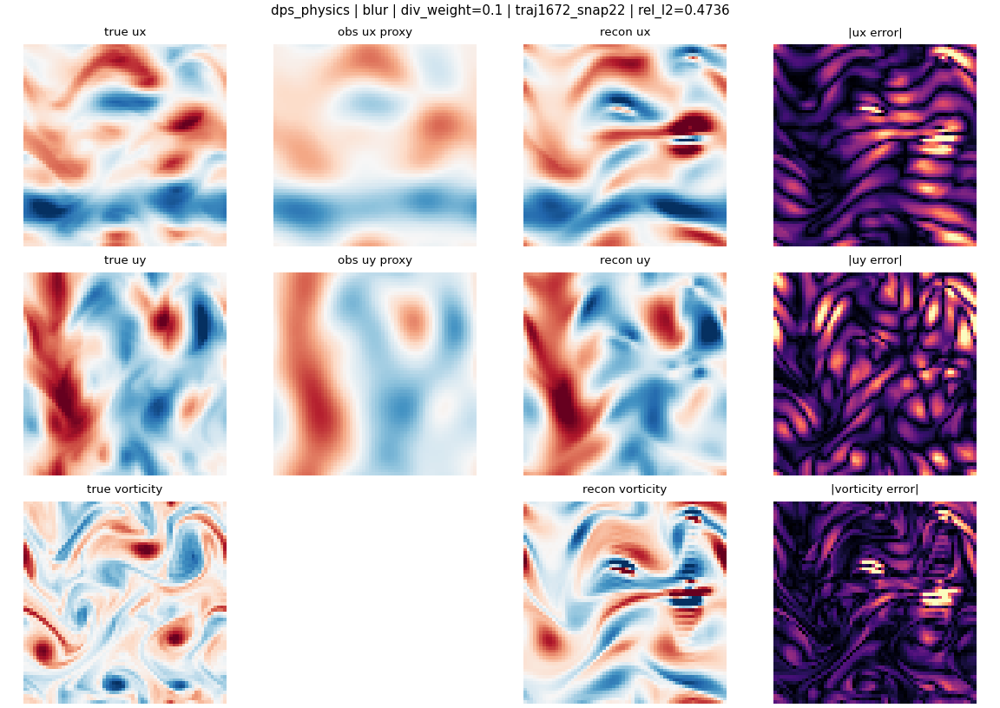

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0005_traj1650_snap15.png


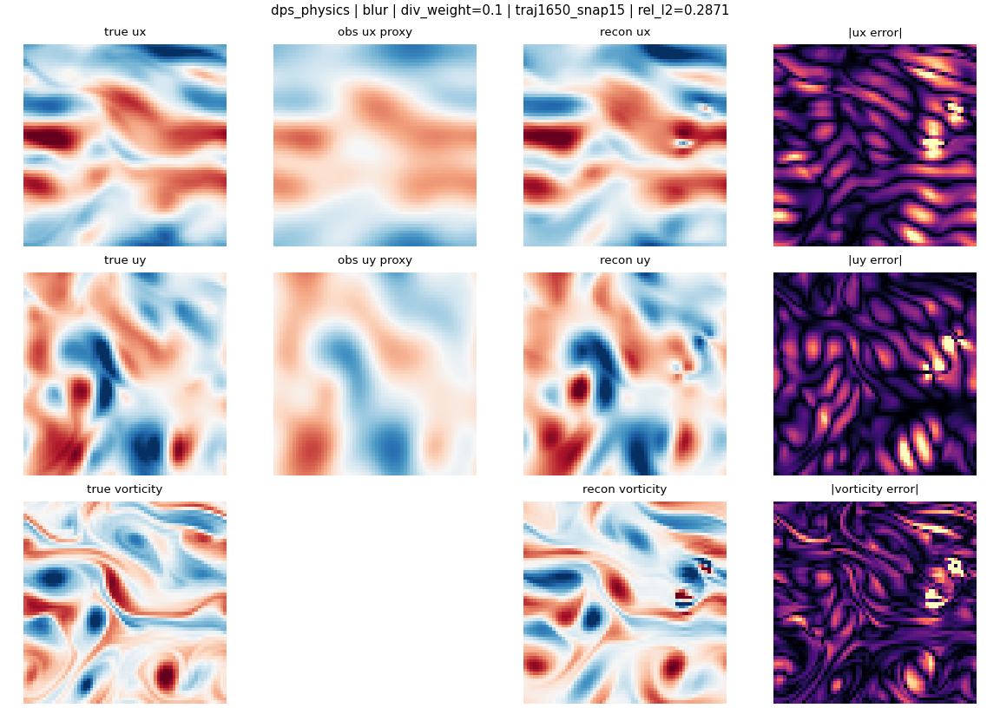

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0006_traj1713_snap12.png


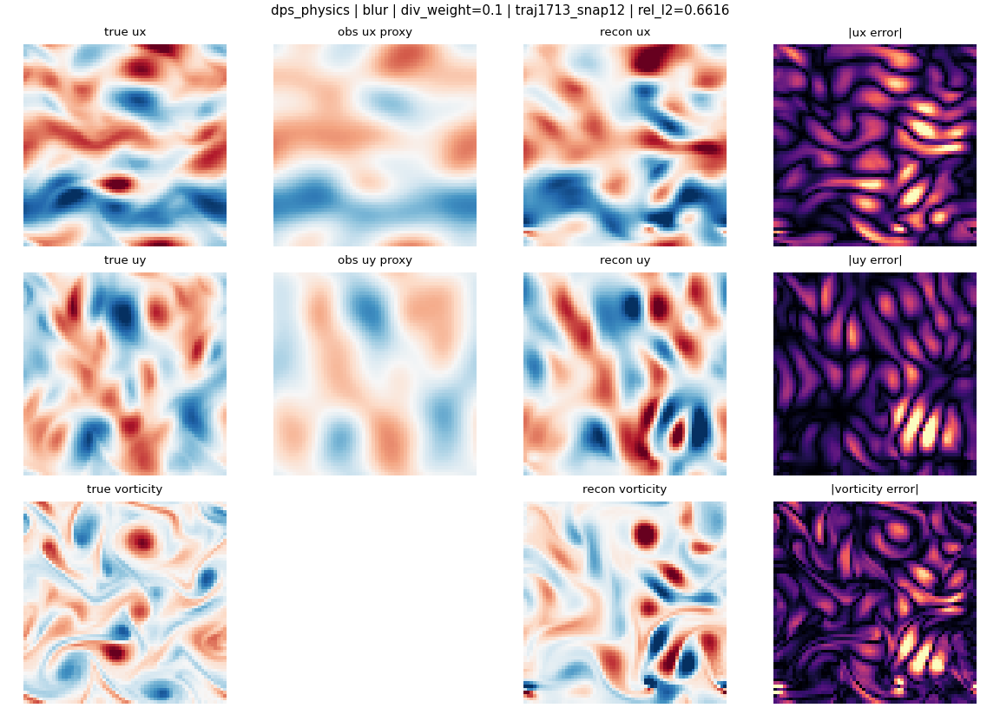

runs_inverse_colab/dps_phys_blur_gw0p03_n16_steps128_sigma4p0/figures/0007_traj1651_snap33.png


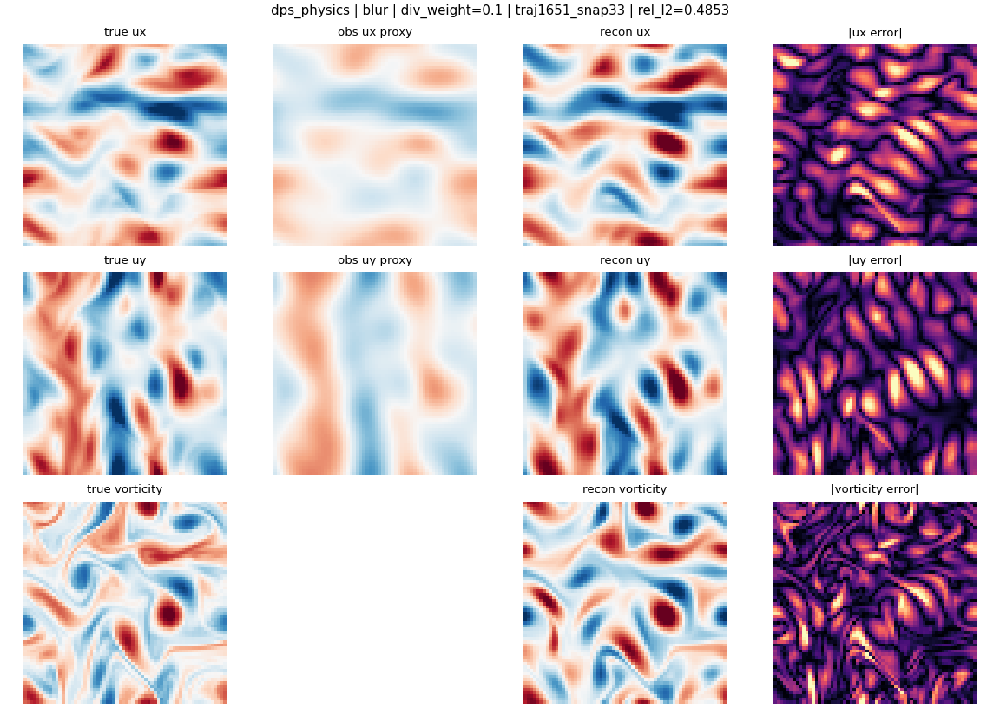

In [13]:
#@title Run strong-blur observation
blur_metrics_paths = run_observation_experiment(
    "blur",
    BLUR_RUNS,
    metric_sample_count=BLUR_METRIC_SAMPLE_COUNT,
    visualization_sample_count=BLUR_VISUALIZATION_SAMPLE_COUNT,
    max_visualizations=BLUR_MAX_VISUALIZATIONS,
    corruption_seed=BLUR_CORRUPTION_SEED,
    noise_sigma=BLUR_NOISE_SIGMA,
    blur_sigma=BLUR_OBS_SIGMA,
    steps=BLUR_DPS_STEPS,
    run_batch_size=BLUR_RUN_BATCH_SIZE,
)


In [14]:
#@title 12. Final eval on the full val dataset
RUN_FULL_VAL_EVAL = True  #@param {type:"boolean"}
FULL_VAL_RUN_BATCH_SIZE = RUN_BATCH_SIZE * 4  #@param {type:"integer"}
FULL_VAL_METRIC_SAMPLE_COUNT = FULL_VAL_RUN_BATCH_SIZE * 5  #@param {type:"integer"}
FULL_VAL_DPS_STEPS = DPS_STEPS  #@param {type:"integer"}
FULL_VAL_VISUALIZATION_SAMPLE_COUNT = 0  #@param {type:"integer"}
FULL_VAL_MAX_VISUALIZATIONS = 0  #@param {type:"integer"}
FULL_VAL_DISPLAY_MAX_IMAGES = 0  #@param {type:"integer"}
FULL_VAL_OPERATORS = ["sparse_grid", "downsample", "blur"]

if RUN_FULL_VAL_EVAL:
    val_public_paths = find_public_paths(DATA_SOURCE, lambda name: name.startswith("val_") and name.endswith(".npz"))
    if not val_public_paths:
        print("WARNING: no val_*.npz files found by listing; using the configured one-val shard only.")
        val_public_paths = [val_public_path]
    print("full-val shards:", len(val_public_paths))
    FULL_VAL_CACHE_DIR.mkdir(parents=True, exist_ok=True)
    for public_path in val_public_paths:
        filename = Path(public_path).name
        target = FULL_VAL_CACHE_DIR / filename
        download_file(yandex_download_href(DATA_SOURCE, public_path), target, filename)

    full_val_jobs = {
        "sparse_grid": (SPARSE_RUNS, SPARSE_CORRUPTION_SEED, SPARSE_NOISE_SIGMA, BLUR_SIGMA),
        "downsample": (DOWN_RUNS, DOWN_CORRUPTION_SEED, DOWN_NOISE_SIGMA, BLUR_SIGMA),
        "blur": (BLUR_RUNS, BLUR_CORRUPTION_SEED, BLUR_NOISE_SIGMA, BLUR_OBS_SIGMA),
    }
    full_val_metrics_paths = []
    for operator_name in FULL_VAL_OPERATORS:
        run_specs, corruption_seed, noise_sigma, blur_sigma = full_val_jobs[operator_name]
        full_val_metrics_paths.extend(run_observation_experiment(
            operator_name,
            run_specs,
            metric_sample_count=FULL_VAL_METRIC_SAMPLE_COUNT,
            visualization_sample_count=FULL_VAL_VISUALIZATION_SAMPLE_COUNT,
            max_visualizations=FULL_VAL_MAX_VISUALIZATIONS,
            corruption_seed=corruption_seed,
            noise_sigma=noise_sigma,
            blur_sigma=blur_sigma,
            steps=FULL_VAL_DPS_STEPS,
            run_batch_size=FULL_VAL_RUN_BATCH_SIZE,
            data_source_dir=FULL_VAL_CACHE_DIR,
            data_tag="full_val",
            display_max_images=FULL_VAL_DISPLAY_MAX_IMAGES,
        ))
else:
    print("Skipping full-val eval. Set RUN_FULL_VAL_EVAL=True for final metrics on all val_*.npz shards.")

full-val shards: 2


val_000.npz:   0%|          | 0.00/164M [00:00<?, ?B/s]

val_001.npz:   0%|          | 0.00/164M [00:00<?, ?B/s]

case: inverse_cases/sparse_grid_full_val_val640_vis0_seed0.npz
running: runs_inverse_colab/dps_sparse_grid_full_val_gw0p03_n640_steps128


dps:sparse_grid:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_sparse_grid_full_val_gw0p03_n640_steps128/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_sparse_grid_full_val_gw0p03_n640_steps128/figures
running: runs_inverse_colab/dps_phys_sparse_grid_full_val_gw0p03_n640_steps128


dps:sparse_grid:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_sparse_grid_full_val_gw0p03_n640_steps128/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_phys_sparse_grid_full_val_gw0p03_n640_steps128/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,sparse_grid,runs_inverse_colab/dps_sparse_grid_full_val_gw...,0.196362,0.077937,0.162495,0.038844,0.088062
1,dps_physics,dps,1,0.1,sparse_grid,runs_inverse_colab/dps_phys_sparse_grid_full_v...,0.198354,0.078703,0.168886,0.026489,0.089179


operator csv: runs_inverse_colab/sparse_grid_full_val_metrics.csv
displaying figures: 0 of 0
case: inverse_cases/downsample_full_val_val640_vis0_seed0.npz
running: runs_inverse_colab/dps_downsample_full_val_gw0p03_n640_steps128


dps:downsample:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_downsample_full_val_gw0p03_n640_steps128/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_downsample_full_val_gw0p03_n640_steps128/figures
running: runs_inverse_colab/dps_phys_downsample_full_val_gw0p03_n640_steps128


dps:downsample:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_downsample_full_val_gw0p03_n640_steps128/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_phys_downsample_full_val_gw0p03_n640_steps128/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,downsample,runs_inverse_colab/dps_downsample_full_val_gw0...,0.288494,0.112468,0.251041,0.004421,0.099099
1,dps_physics,dps,1,0.1,downsample,runs_inverse_colab/dps_phys_downsample_full_va...,0.233650,0.092820,0.181509,0.014277,0.099921


operator csv: runs_inverse_colab/downsample_full_val_metrics.csv
displaying figures: 0 of 0
case: inverse_cases/blur_blur4p0_full_val_val640_vis0_seed0.npz
running: runs_inverse_colab/dps_blur_full_val_gw0p03_n640_steps128_sigma4p0


dps:blur:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_blur_full_val_gw0p03_n640_steps128_sigma4p0/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_blur_full_val_gw0p03_n640_steps128_sigma4p0/figures
running: runs_inverse_colab/dps_phys_blur_full_val_gw0p03_n640_steps128_sigma4p0


dps:blur:   0%|          | 0/5 [00:00<?, ?batch/s]

saved metrics: runs_inverse_colab/dps_phys_blur_full_val_gw0p03_n640_steps128_sigma4p0/metrics.csv
saved figures: 0 in runs_inverse_colab/dps_phys_blur_full_val_gw0p03_n640_steps128_sigma4p0/figures


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,blur,runs_inverse_colab/dps_blur_full_val_gw0p03_n6...,0.447938,0.180149,0.099142,0.031903,0.181821
1,dps_physics,dps,1,0.1,blur,runs_inverse_colab/dps_phys_blur_full_val_gw0p...,0.429429,0.172165,0.100210,0.011491,0.160169


operator csv: runs_inverse_colab/blur_blur4p0_full_val_metrics.csv
displaying figures: 0 of 0


In [15]:
#@title 13. Final combined CSV for all observation variants
if not all_metrics_by_run:
    raise RuntimeError("No metrics were produced yet. Run at least one observation cell first.")

frames = []
for path in all_metrics_by_run.values():
    df = pd.read_csv(path)
    df["run"] = str(path.parent)
    frames.append(df)
all_metrics = pd.concat(frames, ignore_index=True)
RUNS_DIR.mkdir(parents=True, exist_ok=True)
all_csv = RUNS_DIR / "all_metrics.csv"
all_metrics.to_csv(all_csv, index=False)

group_cols = [col for col in ["method_variant", "method", "physics_informed", "div_weight", "operator", "run"] if col in all_metrics.columns]
summary = all_metrics.groupby(group_cols)[["rel_l2", "rmse", "measurement_error", "divergence", "vorticity_rmse"]].mean().reset_index()
summary_csv = RUNS_DIR / "summary.csv"
summary.to_csv(summary_csv, index=False)
display(summary)
print("all metrics:", all_csv)
print("summary:", summary_csv)


,method_variant,method,physics_informed,div_weight,operator,run,rel_l2,rmse,measurement_error,divergence,vorticity_rmse
0,dps,dps,0,0.0,blur,runs_inverse_colab/dps_blur_full_val_gw0p03_n6...,0.447938,0.180149,0.099142,0.031903,0.181821
1,dps,dps,0,0.0,blur,runs_inverse_colab/dps_blur_gw0p03_n16_steps12...,0.430290,0.155020,0.106094,0.009766,0.144767
2,dps,dps,0,0.0,downsample,runs_inverse_colab/dps_downsample_full_val_gw0...,0.288494,0.112468,0.251041,0.004421,0.099099
3,dps,dps,0,0.0,downsample,runs_inverse_colab/dps_downsample_gw0p03_n16_s...,0.303230,0.107270,0.267289,0.004064,0.091480
4,dps,dps,0,0.0,sparse_grid,runs_inverse_colab/dps_sparse_grid_full_val_gw...,0.196362,0.077937,0.162495,0.038844,0.088062
5,dps,dps,0,0.0,sparse_grid,runs_inverse_colab/dps_sparse_grid_gw0p03_n16_...,0.198466,0.072428,0.168952,0.037726,0.080468
6,dps_physics,dps,1,0.1,blur,runs_inverse_colab/dps_phys_blur_full_val_gw0p...,0.429429,0.172165,0.100210,0.011491,0.160169
7,dps_physics,dps,1,0.1,blur,runs_inverse_colab/dps_phys_blur_gw0p03_n16_st...,0.455401,0.166104,0.114217,0.007488,0.147552
8,dps_physics,dps,1,0.1,downsample,runs_inverse_colab/dps_phys_downsample_full_va...,0.233650,0.092820,0.181509,0.014277,0.099921
9,dps_physics,dps,1,0.1,downsample,runs_inverse_colab/dps_phys_downsample_gw0p03_...,0.243767,0.088284,0.190051,0.015062,0.094080


all metrics: runs_inverse_colab/all_metrics.csv
summary: runs_inverse_colab/summary.csv


## Parameter guide

Each observation has a configure/run cell pair. Change the per-observation settings immediately above the run cell, then execute that run cell.

- `METRIC_SAMPLE_COUNT`: number of validation samples used for metrics in each observation cell.
- `VISUALIZATION_SAMPLE_COUNT`: stable visualization prefix size selected by `VISUALIZATION_SEED`. Keep both fixed across people/runs to compare identical PNG examples.
- `MAX_VISUALIZATIONS`: number of PNGs saved and displayed per observation cell. Keep `MAX_VISUALIZATIONS <= VISUALIZATION_SAMPLE_COUNT`.
- `RUN_BATCH_SIZE`: GPU batch size for DPS sampling. The A100 default is 32; reduce to 16 or 8 if OOM.
- `BLUR_SIGMA`: blur corruption strength. This notebook defaults to stronger blur, sigma 4.0.
- `STATS_FILENAME` / `FULL_CHECKPOINT_NAME`: train normalization stats are loaded from stats JSON if present, otherwise from full checkpoint `data_stats`; val stats are only a fallback.
- `*_DPS_GRAD_WEIGHT`: DPS gradient/guidance weight for regular DPS.
- `*_DPS_PHYS_GRAD_WEIGHT`: DPS gradient/guidance weight for physics-informed DPS.
- `*_DPS_PHYS_DIV_WEIGHT`: physics-informed divergence weight. Regular DPS is fixed to `div_weight=0.0`.
- `*_GRADIENT_CLIP`: per-sample gradient norm clip. `0.0` disables clipping, which is the default here.
- `RUN_FULL_VAL_EVAL`: final full-val switch. When enabled, the notebook downloads all `val_*.npz` shards into `FULL_VAL_CACHE_DIR` and runs the configured observation variants with `metric_sample_count=0`, which means all available val samples.

Each observation cell writes its own operator CSV under `runs_inverse_colab/`. The final cell writes `runs_inverse_colab/all_metrics.csv` and `runs_inverse_colab/summary.csv` across all observation variants that were run in the current notebook session.
